In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvas
from scipy.spatial import distance
import random
import pickle

# allow us to re-use the framework from the src directory
import sys, os
sys.path.append(os.path.abspath(os.path.join('../')))

In [2]:
import max_ent.examples.grid_9_by_9 as G
from max_ent.gridworld import Directions
%matplotlib notebook
np.random.seed(123)

In [3]:
def create_world(title, blue, green, cs=[], ca=[], cc=[], start=0, goal=8, vmin=-50, vmax=10):
    n_cfg = G.config_world(blue, green, cs, ca, cc, goal, start)
    n = n_cfg.mdp

    # Generate demonstrations and plot the world
    demo = G.generate_trajectories(n.world, n.reward, n.start, n.terminal)
    vmin = -50
    vmax = 10
    fig = G.plot_world(title, n, n_cfg.state_penalties,
           n_cfg.action_penalties, n_cfg.color_penalties,
           demo, n_cfg.blue, n_cfg.green, vmin=vmin, vmax=vmax)   
    return n, n_cfg, demo, fig

In [4]:
def total_reward(trajectory, world, constraints):
    grid = world.mdp
    reward = 0
    count_cs = 0
    count_ca = 0
    count_cb = 0
    count_cg = 0
    for state in trajectory.transitions():
        #check for action constraints violation
        reward += grid.reward[state]
        for constraint in constraints['ca']:
            if (state[1] == constraint.idx): 
                count_ca += 1
                
        #check for color constraints violation        
        for constraint in constraints['blue']:
            if (state[0] == constraint): 
                count_cb += 1
        
        #check for color constraints violation        
        for constraint in constraints['green']:
            if (state[0] == constraint): 
                count_cg += 1
                
        #check for state constraints violation
        for constraint in constraints['cs']:
            if (state[0] == constraint): 
                count_cs += 1
                
    return reward, count_cs, count_ca, count_cb, count_cg
        

# calculate the kl divergence
def kl_divergence(p, q):
    p = np.reshape(p, (-1,1))
    q = np.reshape(q, (-1,1))
    return sum(p[i] * math.log2(p[i]/q[i]) for i in range(len(p)))
    
# calculate the js divergence
def js_divergence(p, q):
    p = np.reshape(p, (-1,1))
    q = np.reshape(q, (-1,1))
    m = 0.5 * (p + q)
    return 0.5 * kl_divergence(p, m) + 0.5 * kl_divergence(q, m)

#count how many times a state is visited, and compute the average length of the trajectories
def count_states(trajectories, world, constraints):
    grid = world.mdp
    count_matrix = np.ones((8,9,9)) * 1e-10
    avg_length = 0.0
    avg_reward = 0.0
    avg_violated = 0.0
    avg_cs = 0.0
    avg_ca = 0.0
    avg_cb = 0.0
    avg_cg = 0.0
    n = len(trajectories)
    for trajectory in trajectories:
        avg_length += len(trajectory.transitions())
        #print(trajectory)
        #print(list(trajectory.transitions()))
        reward, count_cs, count_ca, count_cb, count_cg = total_reward(trajectory, world, constraints)
        avg_reward += reward
        avg_violated += (count_cs + count_ca + count_cb + count_cg)
        avg_cs += count_cs
        avg_ca += count_ca
        avg_cb += count_cb
        avg_cg += count_cg
        for state in trajectory.states():
            #print(state)
            count_matrix[0][grid.world.state_index_to_point(state)] += 1
            
    return count_matrix / n, avg_length / n, avg_reward / n, avg_violated/n, (avg_cs/n, avg_ca/n, avg_cb/n, avg_cg/n)

In [5]:
def generate_constraints():
    list_available = [x for x in range(81)] #generate the list of non-constrained states

    blue = np.random.choice(list_available, 6) # blue states
    list_available = np.setdiff1d(list_available, blue) # remove blue states from the list of non-constrained states

    green = np.random.choice(list_available, 6) # green states
    list_available = np.setdiff1d(list_available, green) # remove green states from the list of non-constrained states

    cs = np.random.choice(list_available, 6) # constrained states
    list_available = np.setdiff1d(list_available, cs) # remove constrained states from the list of non-constrained states

    #print(blue)
    #print(green)
    #print(cs)
    #print(list_available)
    
    random_ca = np.random.choice(8, 2) # green states
    ca = [Directions.ALL_DIRECTIONS[d] for d in random_ca]
    #print(ca)

    start = random.choice(list_available) # generate start state from the list of non-constrained states 
    goal = random.choice(list_available) # generate terminal state from the list of non-constrained states

    return blue, green, cs, ca, start, goal

# Nominal world

<IPython.core.display.Javascript object>


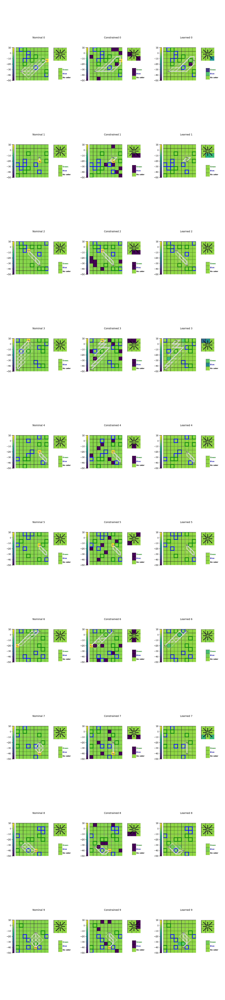

<IPython.core.display.Javascript object>


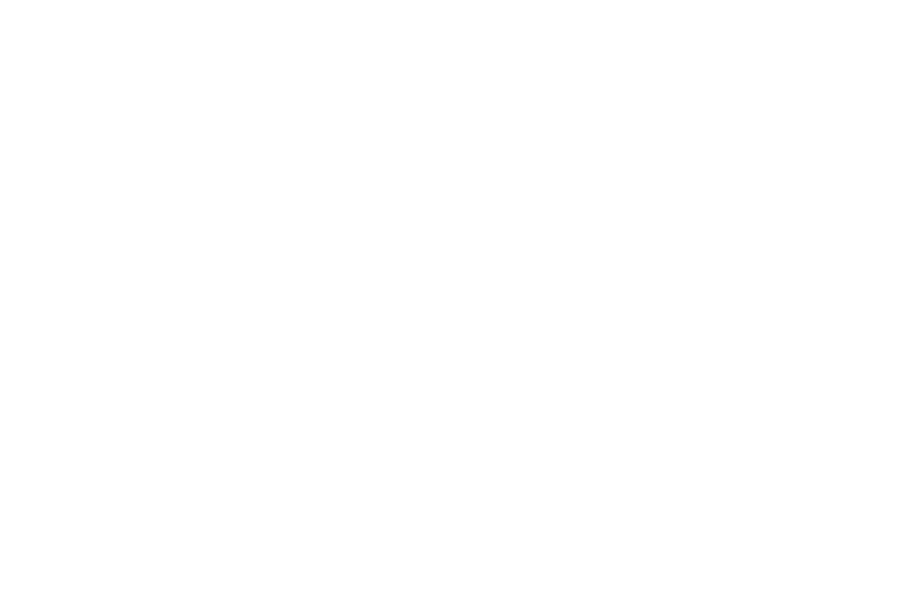

         1: DELTA:  0.00000, MAE:  0.158709753144989
       101: DELTA:  1.03403, MAE:  0.108248084235649
       201: DELTA:  0.09371, MAE:  0.014976620146708
       301: DELTA:  0.13091, MAE:  0.012245744764993
       401: DELTA:  0.18741, MAE:  0.010344790205854


<IPython.core.display.Javascript object>


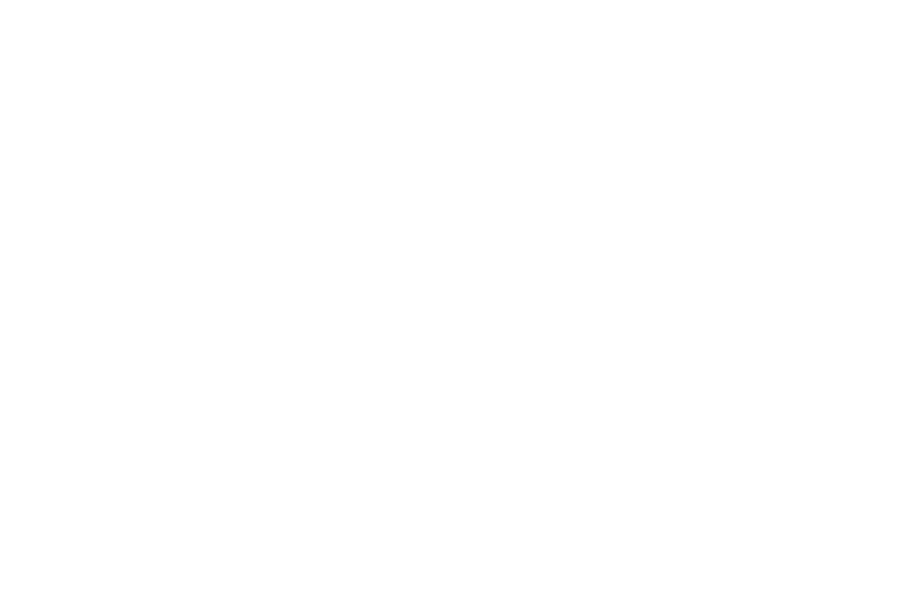

<IPython.core.display.Javascript object>


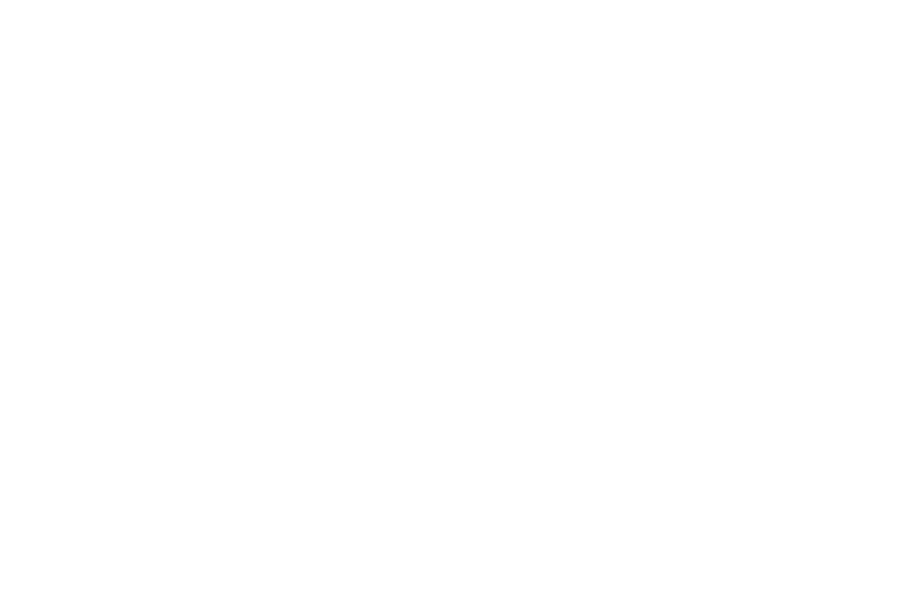

         1: DELTA:  0.00000, MAE:  0.066131346383750
       101: DELTA:  0.02531, MAE:  0.041496024912857


<IPython.core.display.Javascript object>


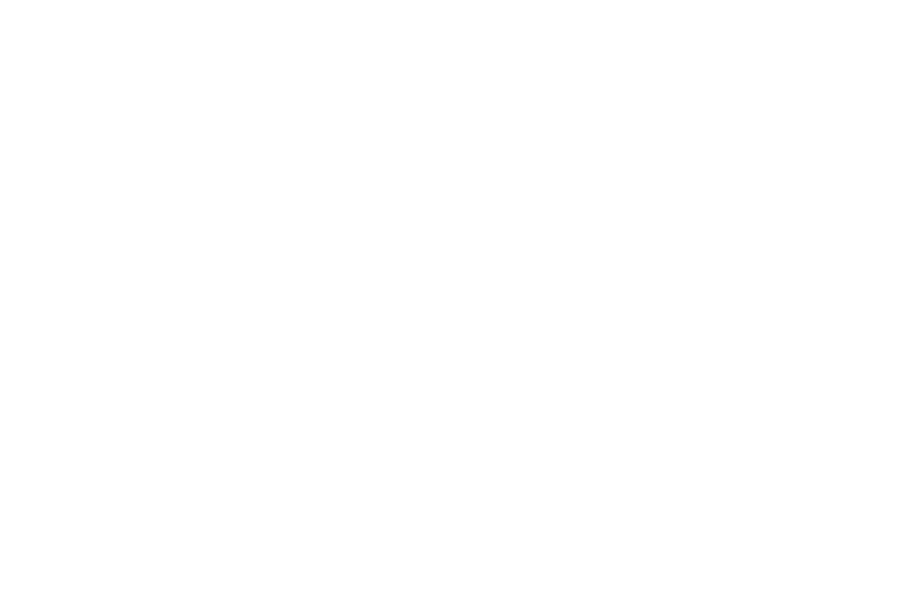

<IPython.core.display.Javascript object>


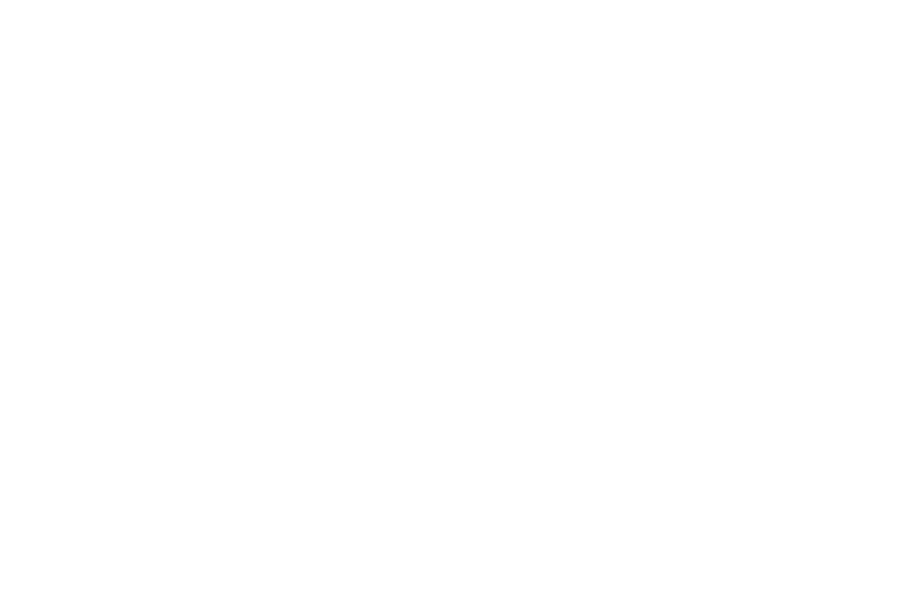

         1: DELTA:  0.00000, MAE:  0.011463046219666


<IPython.core.display.Javascript object>


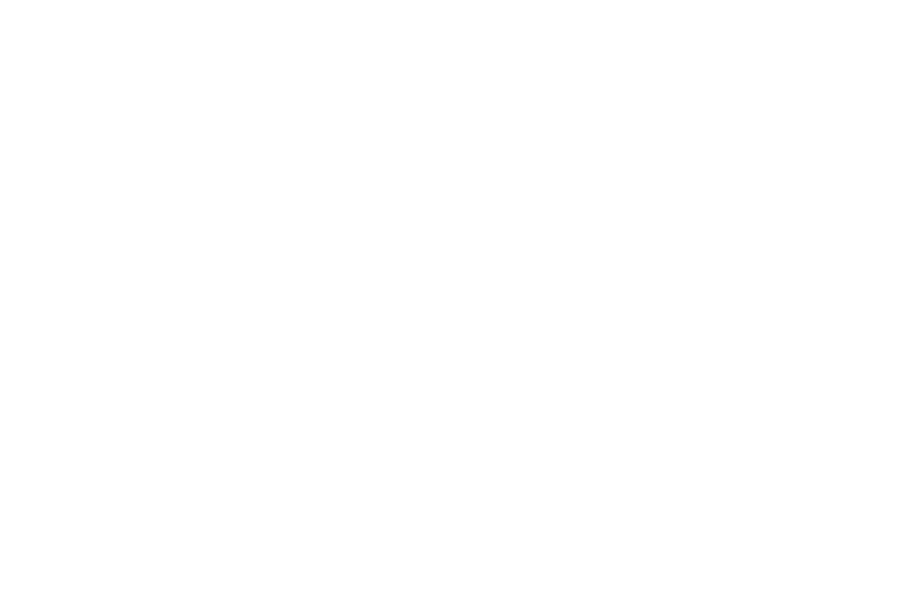

<IPython.core.display.Javascript object>


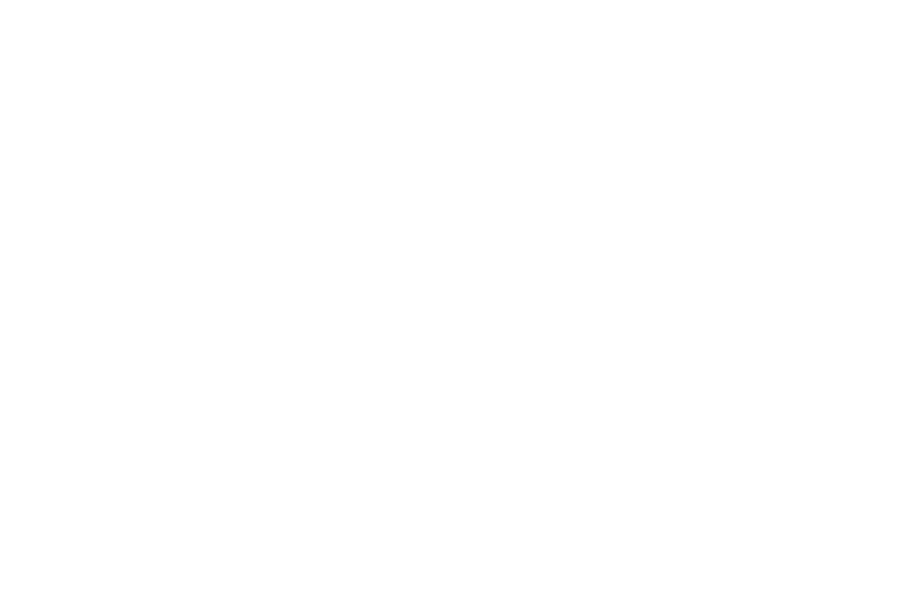

         1: DELTA:  0.00000, MAE:  0.343016771111838
       101: DELTA:  0.04989, MAE:  0.099607874809613
       201: DELTA:  0.05366, MAE:  0.054259384113116
       301: DELTA:  0.05467, MAE:  0.028028776282903
       401: DELTA:  0.06532, MAE:  0.022435638885600


<IPython.core.display.Javascript object>


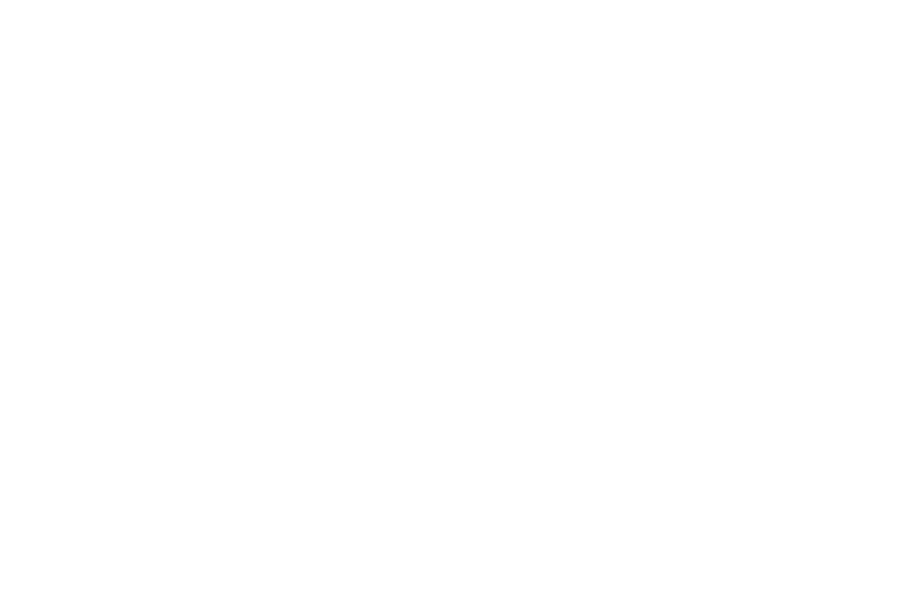

<IPython.core.display.Javascript object>


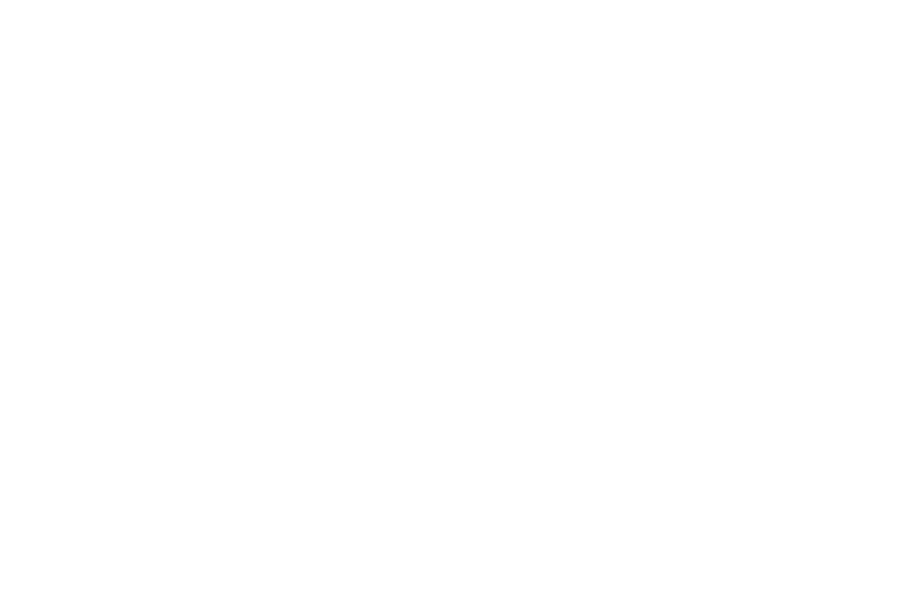

         1: DELTA:  0.00000, MAE:  0.015906079147988
       101: DELTA:  0.00016, MAE:  0.015893124411914


<IPython.core.display.Javascript object>


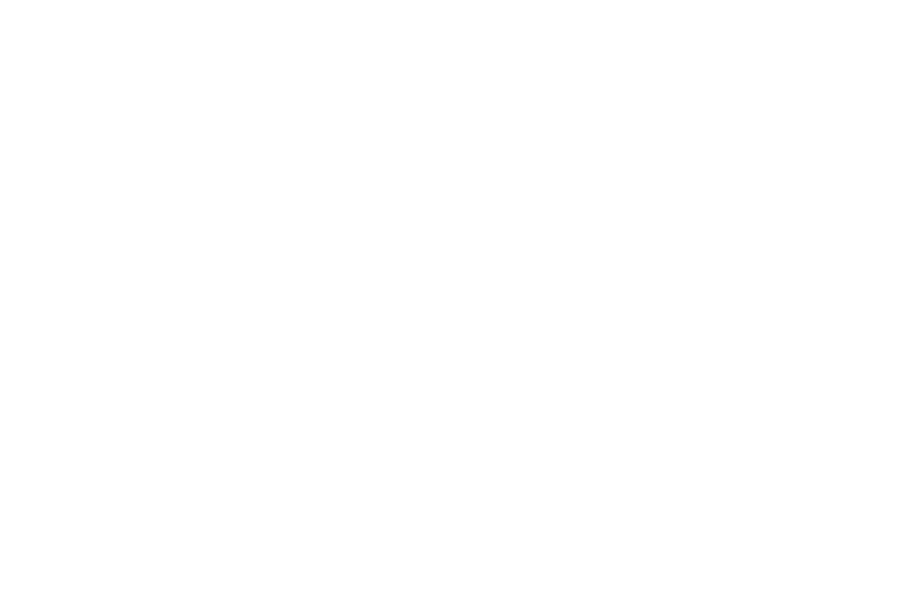

<IPython.core.display.Javascript object>


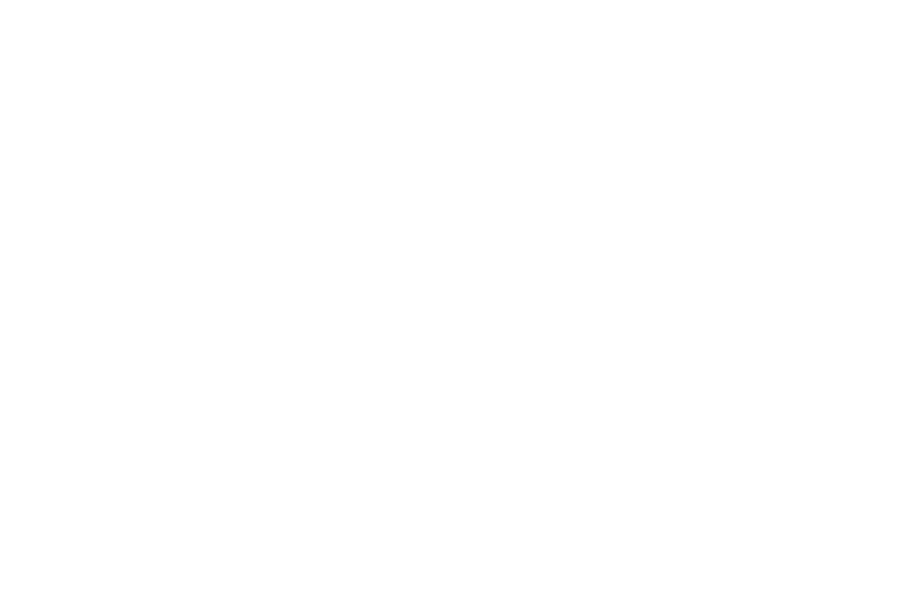

         1: DELTA:  0.00000, MAE:  0.011964572076582


<IPython.core.display.Javascript object>


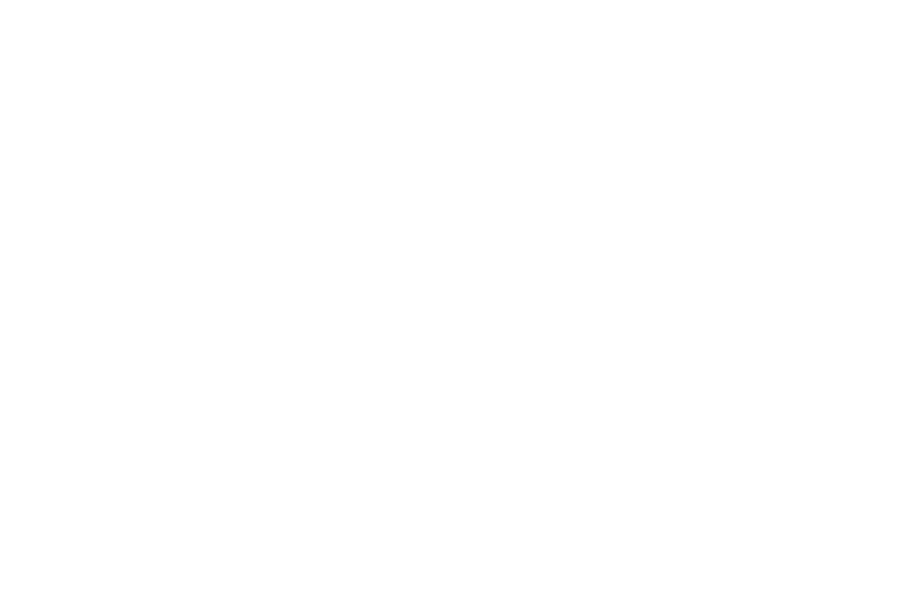

<IPython.core.display.Javascript object>


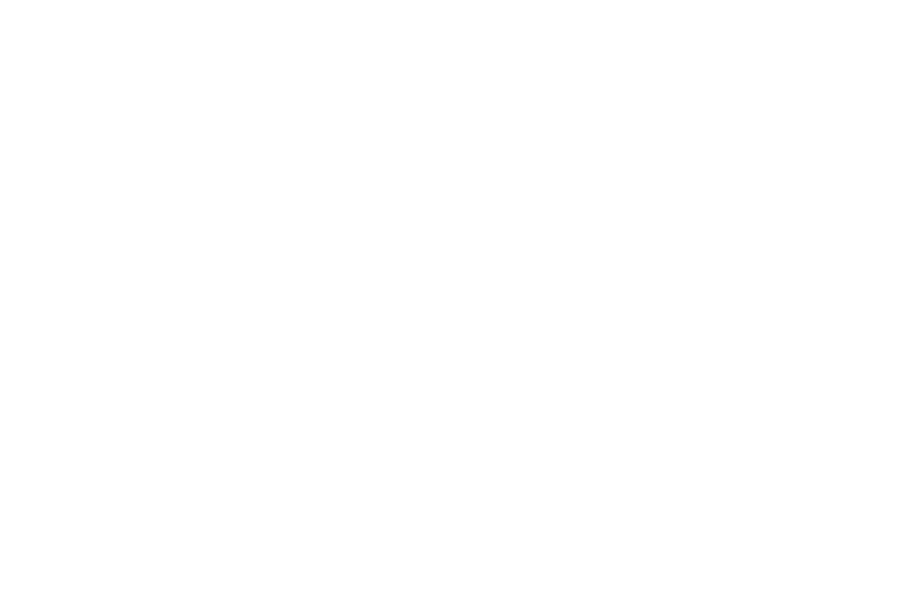

         1: DELTA:  0.00000, MAE:  0.068624213281690
       101: DELTA:  0.00675, MAE:  0.039754292893269
       201: DELTA:  0.04488, MAE:  0.026283270653906
       301: DELTA:  0.01876, MAE:  0.019763509679288
       401: DELTA:  0.02162, MAE:  0.016567351732319


<IPython.core.display.Javascript object>


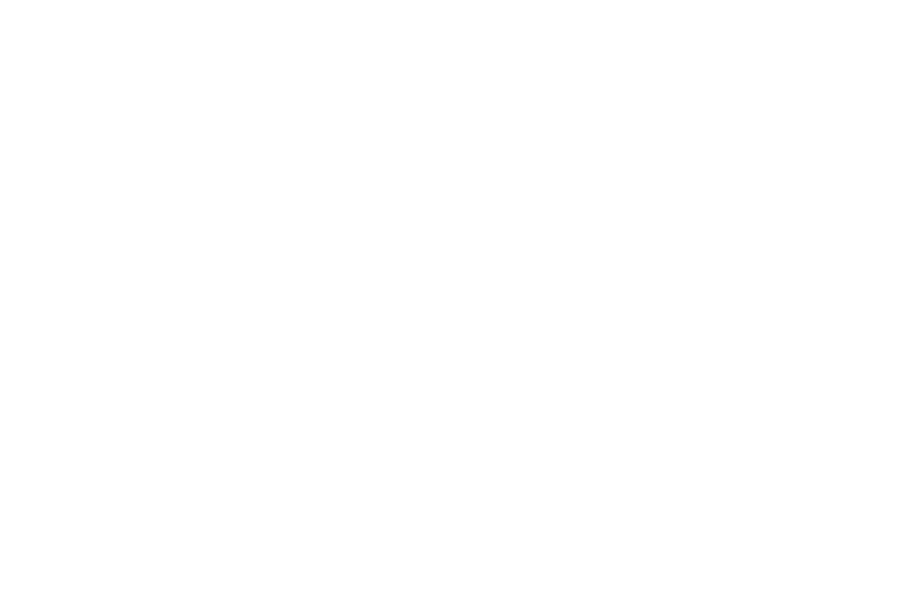

<IPython.core.display.Javascript object>


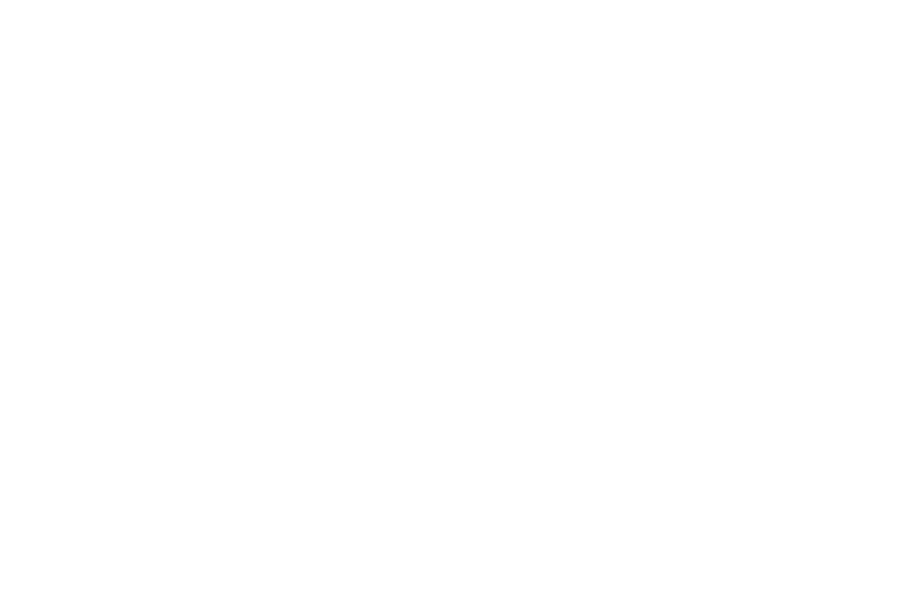

         1: DELTA:  0.00000, MAE:  0.083756714106462
       101: DELTA:  0.05580, MAE:  0.012515893158943
       201: DELTA:  0.01136, MAE:  0.010244962353160
       301: DELTA:  0.00604, MAE:  0.010060488262018


<IPython.core.display.Javascript object>


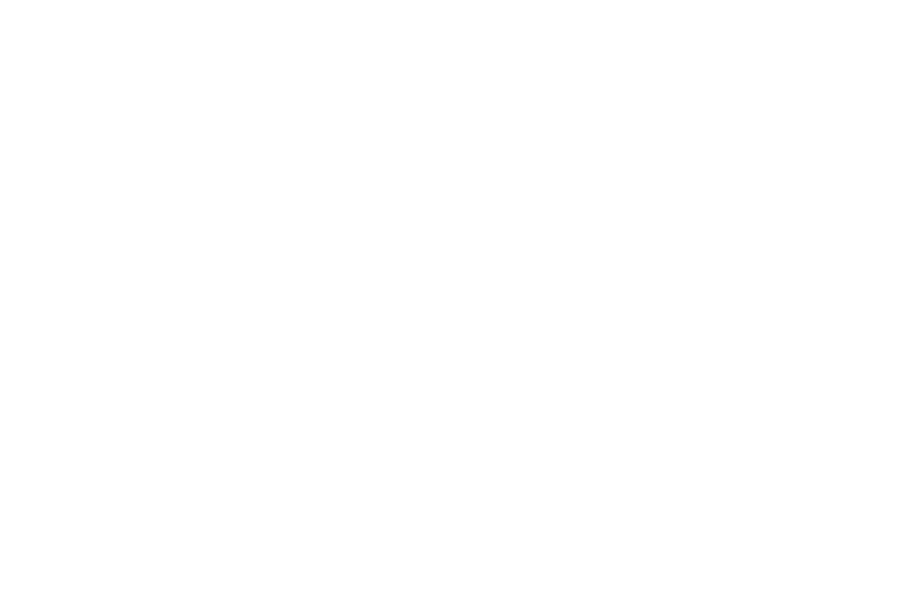

<IPython.core.display.Javascript object>


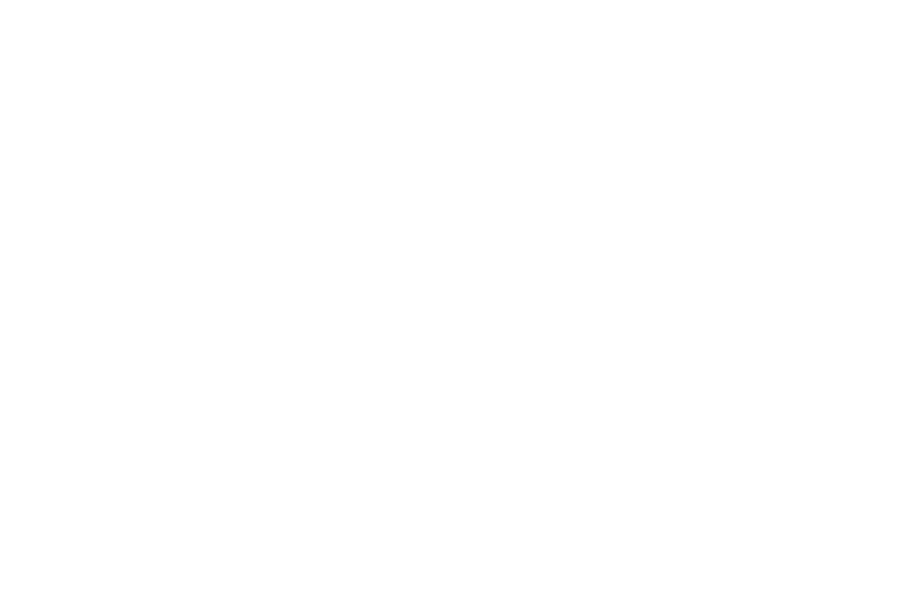

         1: DELTA:  0.00000, MAE:  0.052956493503661
       101: DELTA:  0.02338, MAE:  0.046274342164332
       201: DELTA:  0.02585, MAE:  0.019993522077464


<IPython.core.display.Javascript object>


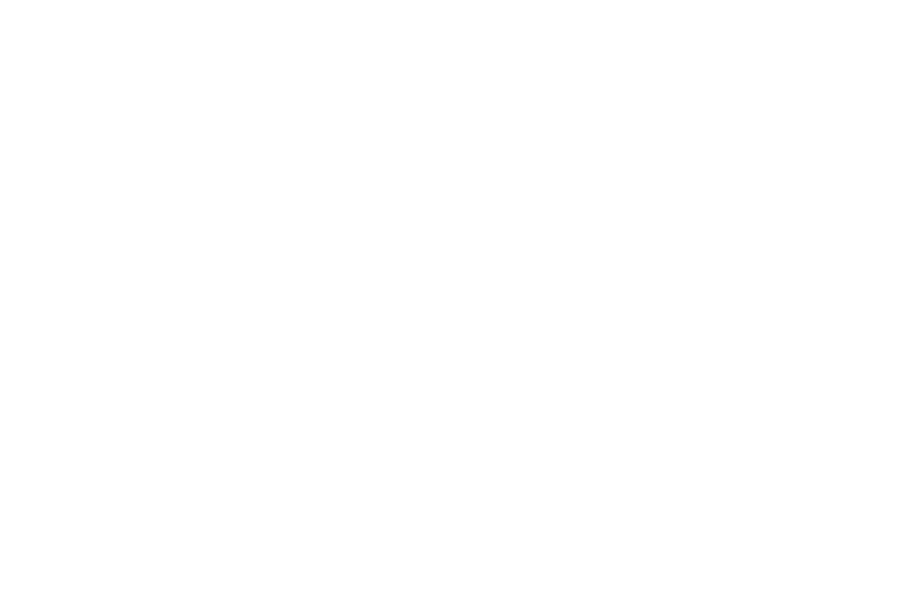

<IPython.core.display.Javascript object>


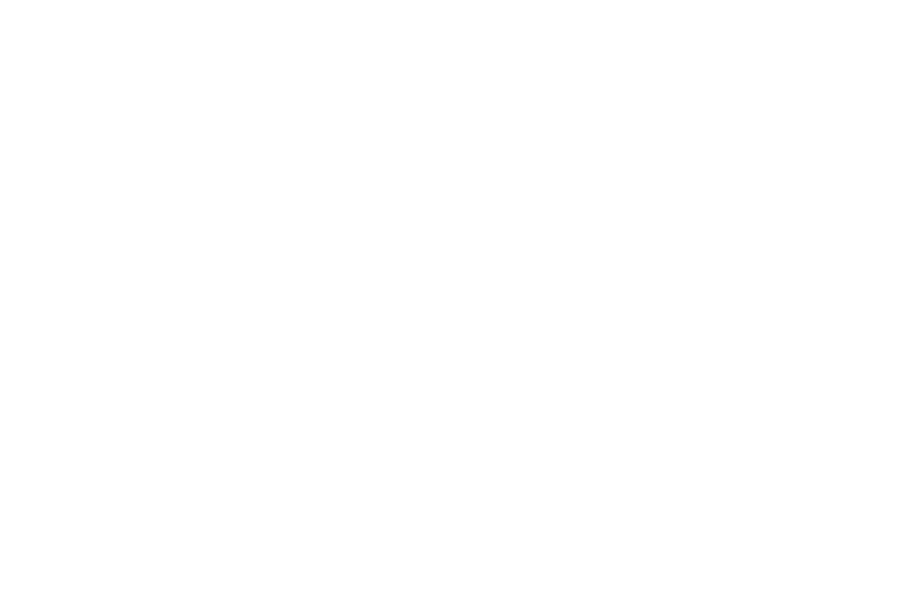

         1: DELTA:  0.00000, MAE:  0.046625315568675
       101: DELTA:  0.01046, MAE:  0.045086046367633
       201: DELTA:  0.03545, MAE:  0.018157605054519
       301: DELTA:  0.00909, MAE:  0.014110939988024


<IPython.core.display.Javascript object>


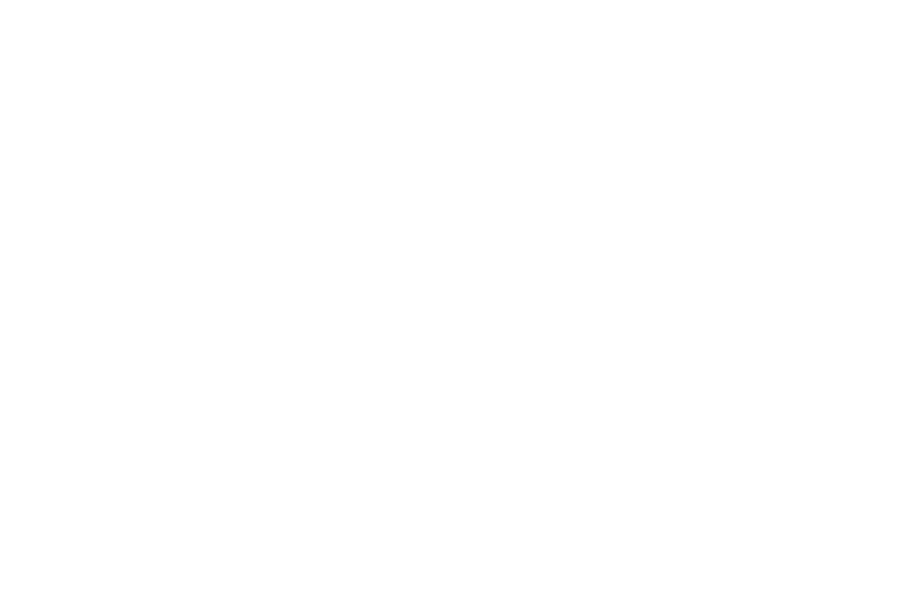

In [6]:
n_tests = 10
fig = plt.figure(figsize=(9, 40))
axis = fig.subplots(n_tests, 3)

worlds =[]

# GENERATE 9 NOMINAL WORLDS
for i in range(n_tests):
    blue, green, cs, ca, start, goal = generate_constraints()

    plt.ioff()
    n, n_cfg, demo_n, f1 = create_world('Nominal', blue, green, start=start, goal=goal)

    plt.close()
    plt.ion()
    canvas = FigureCanvas(f1)
    canvas.draw()
    X = np.array(canvas.renderer.buffer_rgba())
    
    x = i
    y = 0 
    axis[x,y].axis('off')   
    axis[x,y].set_title(f'Nominal {i}', fontsize=7)
    axis[x,y].imshow(X)
    
    #cs = [31, 39, 41, 47, 51]  # constrained states
    #ca = [Directions.UP_LEFT, Directions.UP_RIGHT]  # constrained actions
    cc = [1, 2]  # constrained colors

    c, c_cfg, demo_c, f2 = create_world('Constrained', blue, green, cs, ca, cc, start=start, goal=goal)
    
    plt.close()
    plt.ion()
    canvas = FigureCanvas(f2)
    canvas.draw()
    X = np.array(canvas.renderer.buffer_rgba())
    
    x = i
    y = 1 
    axis[x,y].axis('off')   
    axis[x,y].set_title(f'Constrained {i}', fontsize=7)
    axis[x,y].imshow(X)
    
    learned_params = G.learn_constraints(n.reward, c.world, c.terminal, demo_c.trajectories)
    learned_mdp = G.MDP(c.world, learned_params.reward, c.terminal, c.start)
    demo_l = G.generate_trajectories(c.world, learned_params.reward, c.start, c.terminal)

    #print(c.world)
    #rl_matrix, avg_rl, avg_reward, avg_violated = count_states(demo_l[0], c)
    #print(avg_reward)
    #print(avg_violated)

    p = G.plot_world('Learned Constrained', learned_mdp, learned_params.state_weights, 
                  learned_params.action_weights, learned_params.color_weights, 
                  demo_l, c_cfg.blue, c_cfg.green, vmin=-50, vmax=10)
    
    plt.close()
    plt.ion()
    canvas = FigureCanvas(p)
    canvas.draw()
    X = np.array(canvas.renderer.buffer_rgba())
    
    x = i
    y = 2 
    axis[x,y].axis('off')   
    axis[x,y].set_title(f'Learned {i}', fontsize=7)
    axis[x,y].imshow(X)
    
    worlds.append({'n': n_cfg,'c': c_cfg,'learned_params': learned_params,'learned_mdp': learned_mdp, \
                   'demo_n': demo_n, 'demo_c': demo_c, 'demo_l': demo_l, 'constraints': {'blue': blue, 'green': green, 'cs':cs, 'ca':ca}})

    
    
fig.tight_layout()

## Learn constraints

In [ ]:
worlds[1]['demo_n'].trajectories
count_states(worlds[1]['demo_c'].trajectories,worlds[1]['c'], worlds[1]['constraints'])



<IPython.core.display.Javascript object>


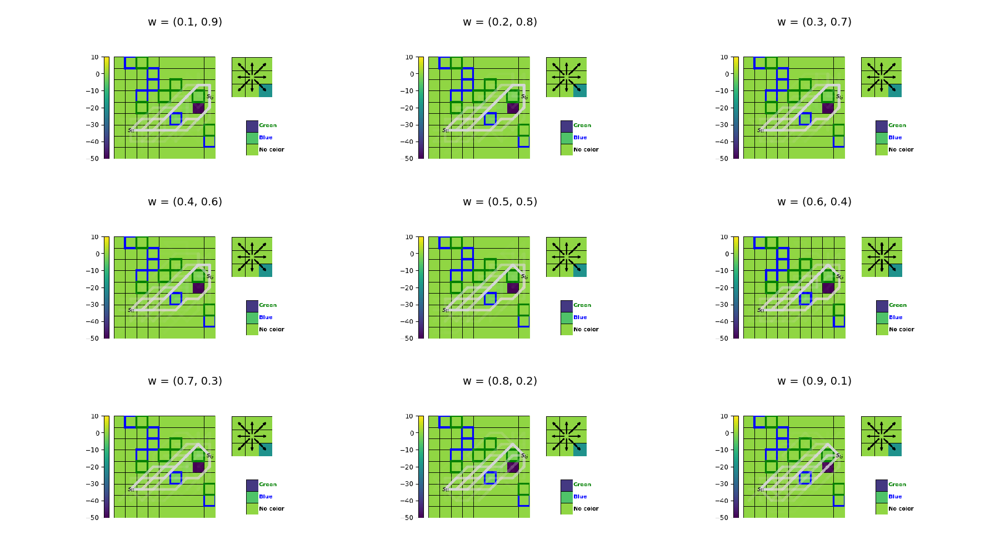

<IPython.core.display.Javascript object>


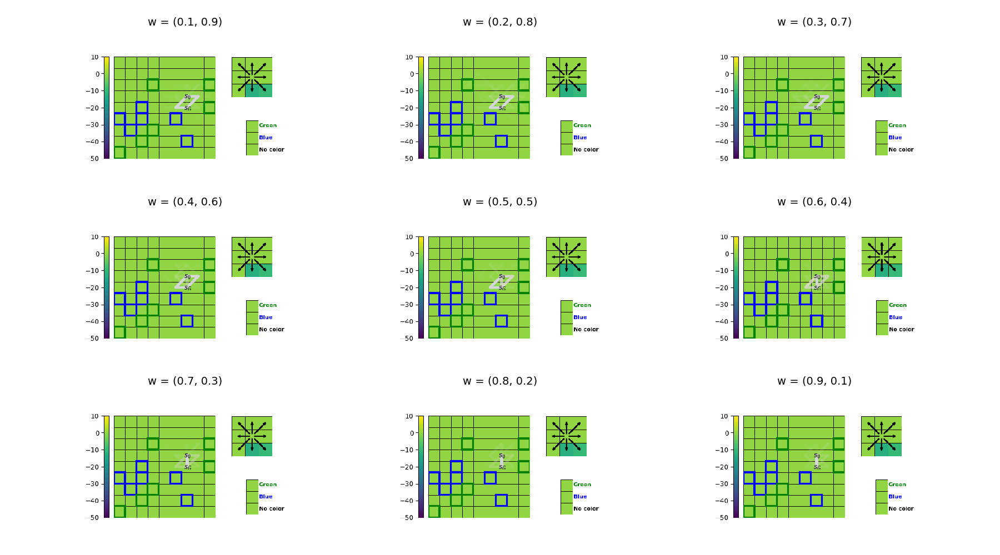

<IPython.core.display.Javascript object>


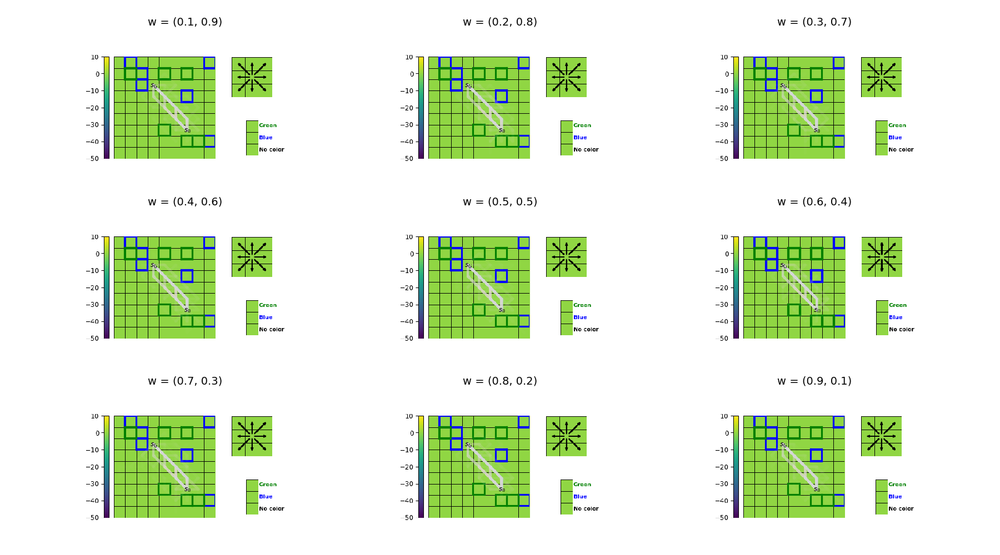

<IPython.core.display.Javascript object>


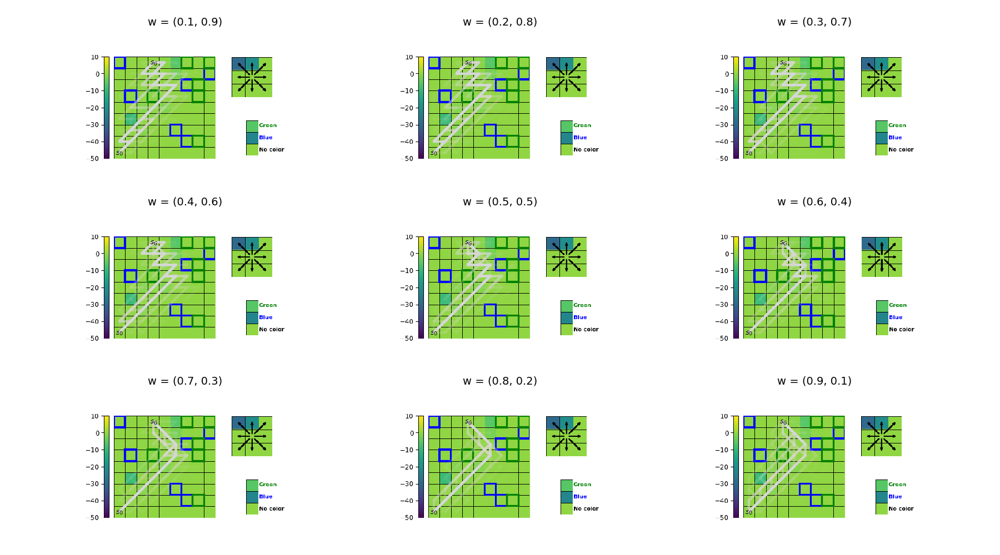

<IPython.core.display.Javascript object>


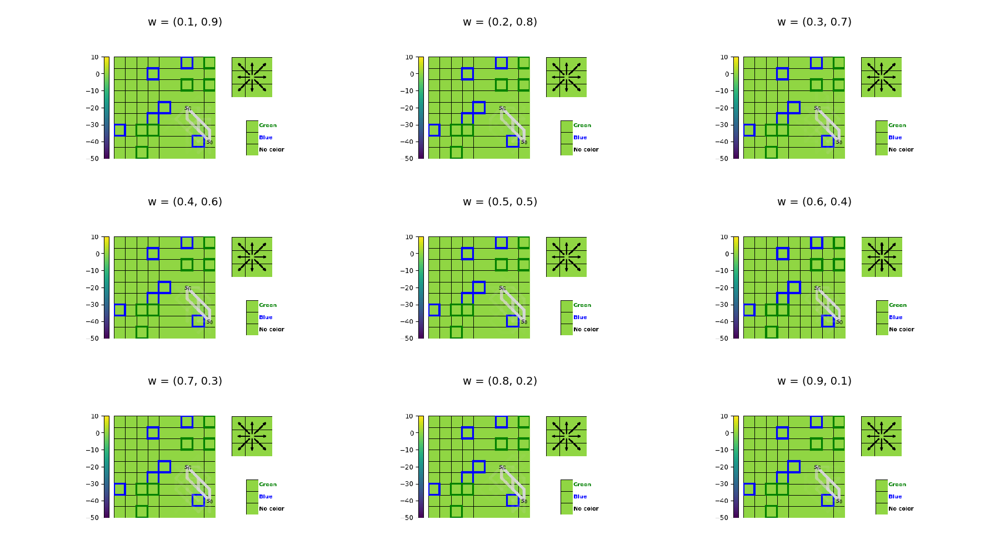

<IPython.core.display.Javascript object>


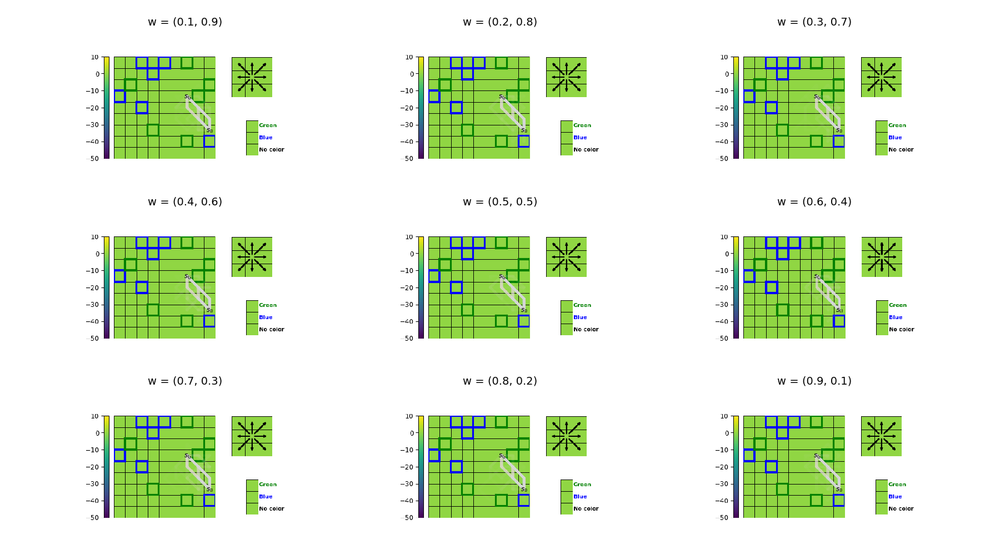

<IPython.core.display.Javascript object>


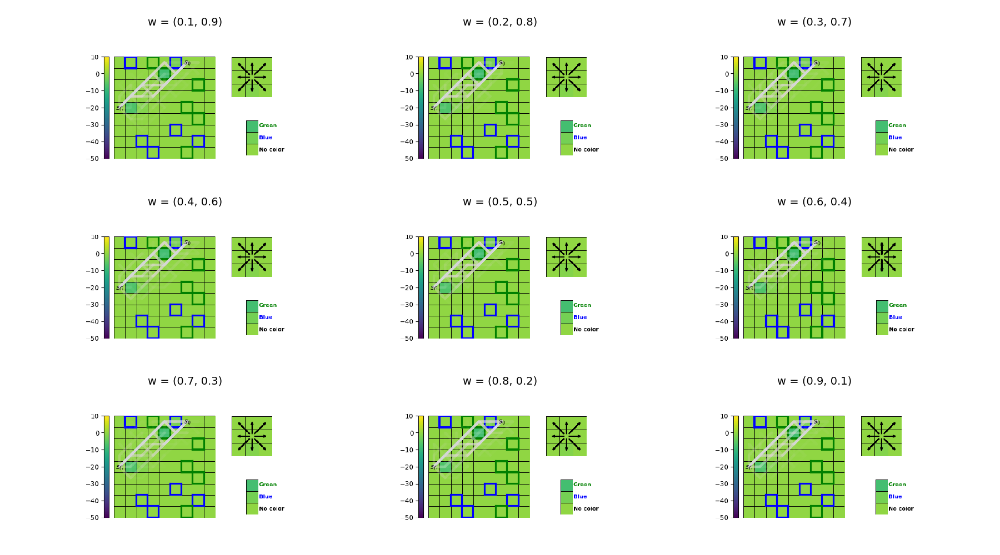

<IPython.core.display.Javascript object>


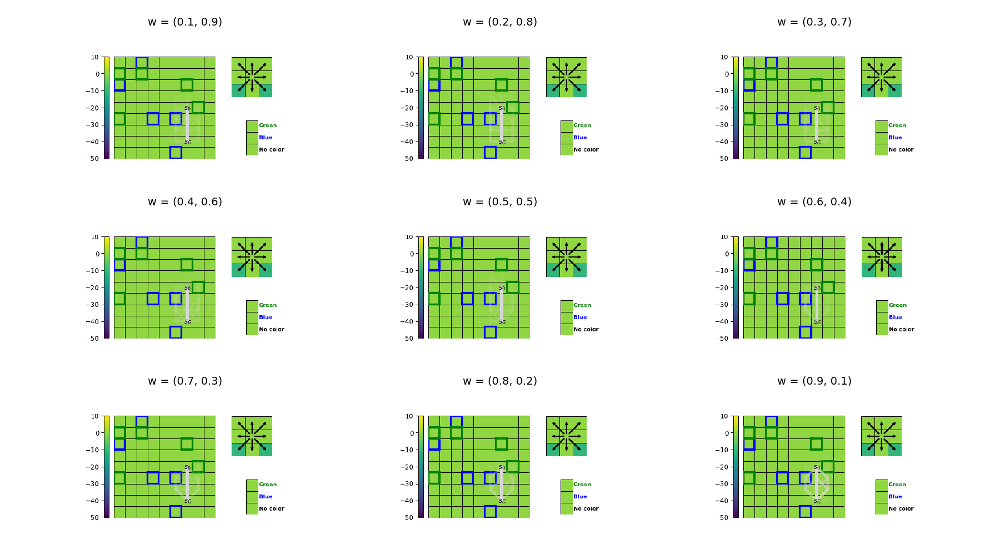

<IPython.core.display.Javascript object>


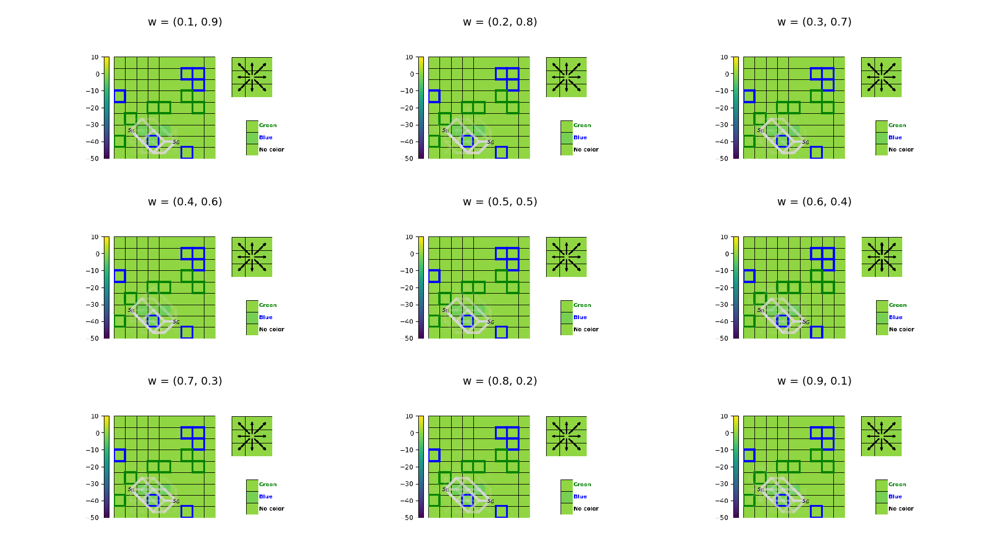

<IPython.core.display.Javascript object>


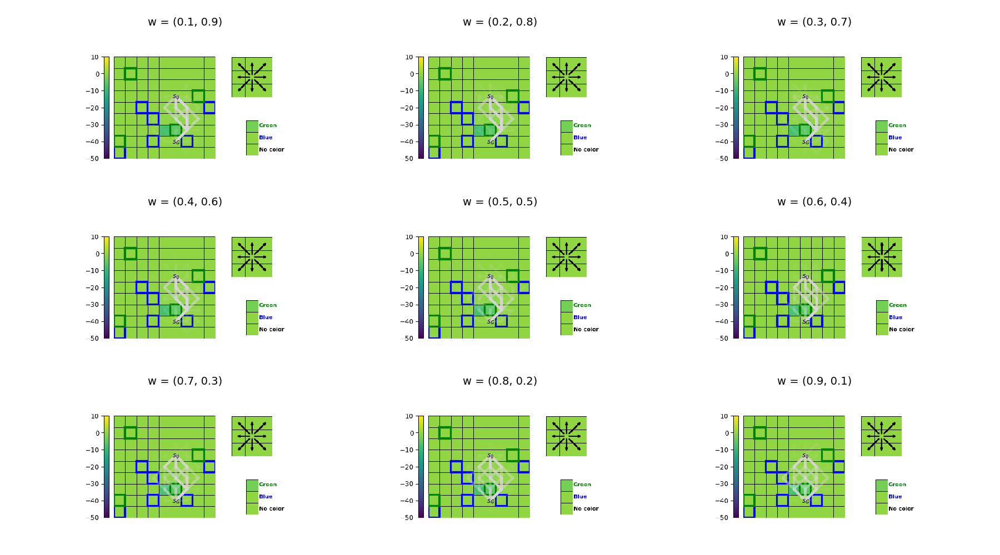

In [8]:
wrl_matrix = []   

#[n, c, learned_params, learned_mdp]

for test in range(n_tests):
    fig = plt.figure(figsize=(9, 5))
    axis = fig.subplots(3, 3)

    n_cfg = worlds[test]['n']
    c_cfg = worlds[test]['c']
    constraints = worlds[test]['constraints']
    n = n_cfg.mdp
    c = c_cfg.mdp
    learned_params = worlds[test]['learned_params']
    learned_mdp = worlds[test]['learned_mdp']
    
    wrl_matrix.append([])

    for i in range(9):
        w = [(i+1)/10, 1 - (i+1)/10]
        demo_wrl = G.generate_weighted_average_trajectories(c.world, n.reward, learned_params.reward, c.start, c.terminal, w)
        temp_matrix, avg_length, avg_reward, avg_violated, counters = count_states(demo_wrl.trajectories, c_cfg, constraints)

        wrl_matrix[test].append({i: {'temp_matrix': temp_matrix, 'demo': demo_wrl, 'avg_length': avg_length, 'avg_reward':avg_reward, 'avg_violated': avg_violated, 'counters': counters}})
        
        plt.ioff()
        f1 = G.plot_world(f'w = ({w[0]:0.1f}, {w[1]:0.1f})', learned_mdp, learned_params.state_weights, 
                      learned_params.action_weights, learned_params.color_weights, 
                      demo_wrl, c_cfg.blue, c_cfg.green, vmin=-50, vmax=10)
        plt.close()
        plt.ion()
        canvas = FigureCanvas(f1)
        canvas.draw()
        X = np.array(canvas.renderer.buffer_rgba())

        x = i // 3
        y = i % 3
        axis[x,y].axis('off')   
        axis[x,y].set_title(f'w = ({w[0]:0.1f}, {w[1]:0.1f})', fontsize=7)
        axis[x,y].imshow(X)



    fig.tight_layout()

## MDFT as orchestrator

In [ ]:
wrl_matrix

<IPython.core.display.Javascript object>


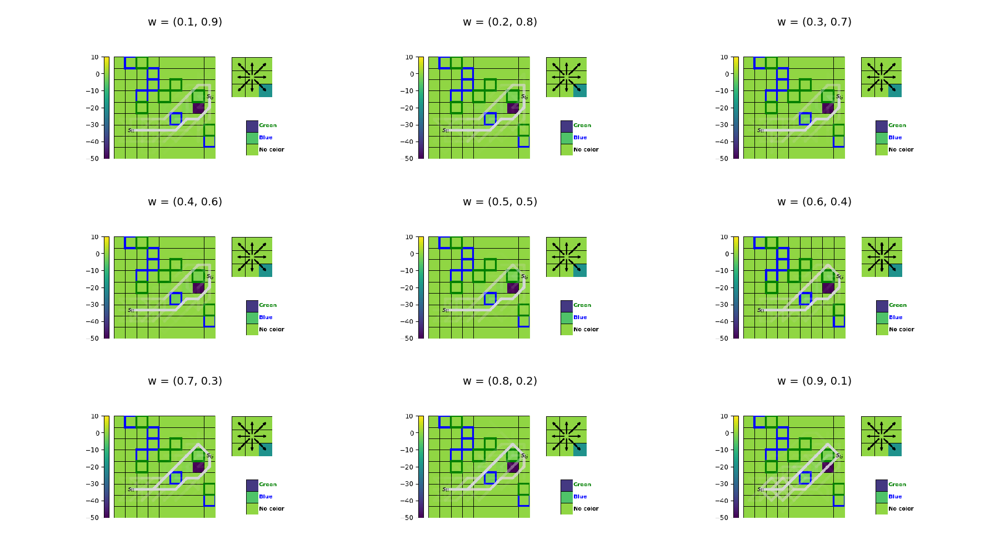

<IPython.core.display.Javascript object>


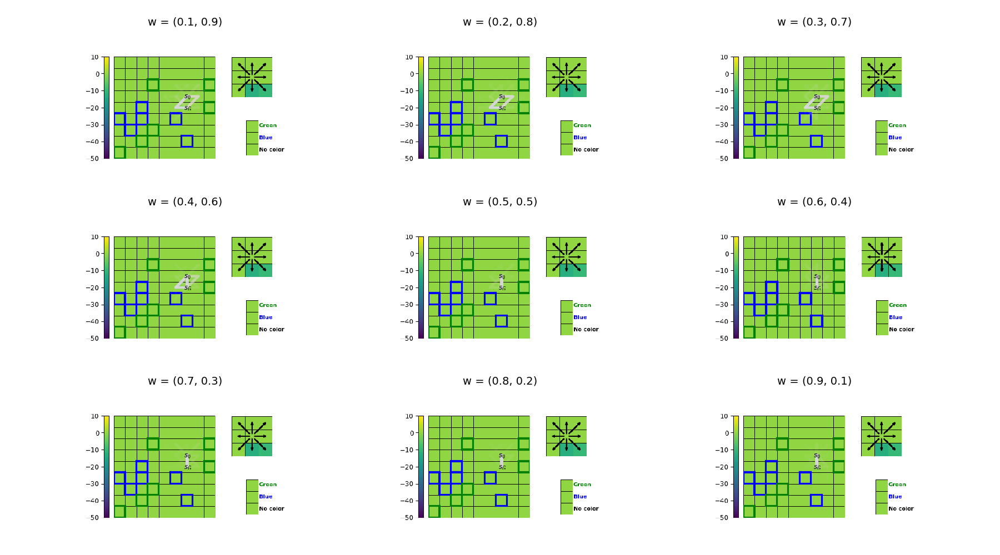

<IPython.core.display.Javascript object>


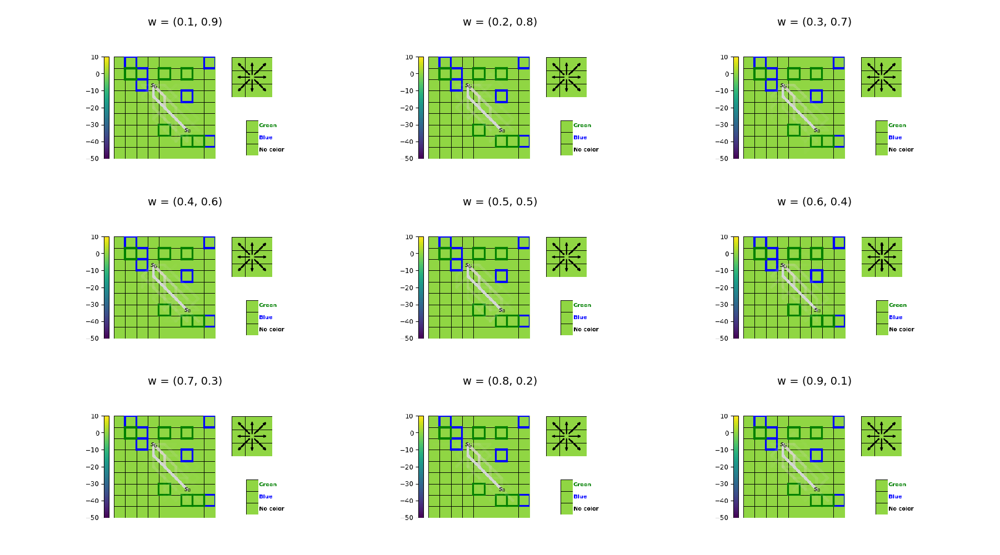

<IPython.core.display.Javascript object>


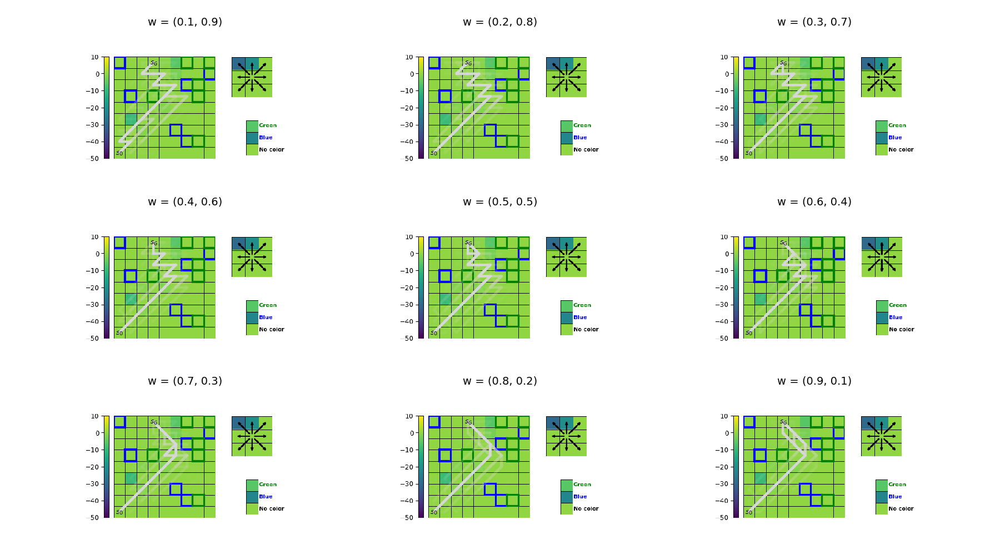

<IPython.core.display.Javascript object>


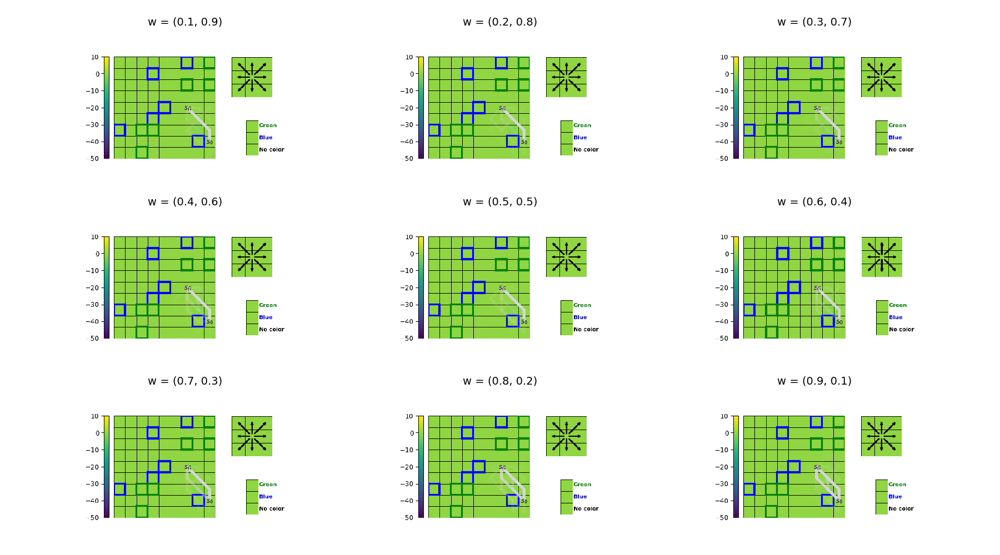

<IPython.core.display.Javascript object>


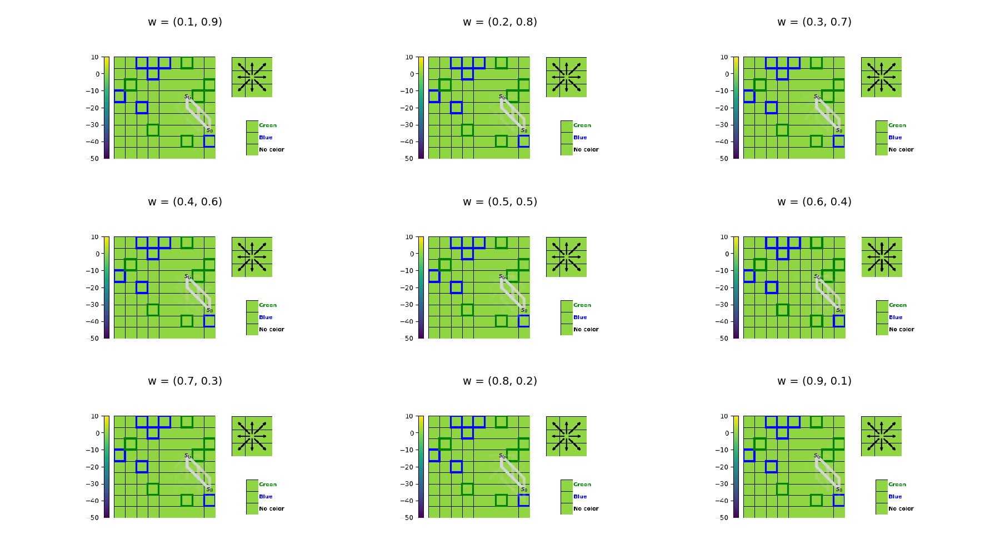

<IPython.core.display.Javascript object>


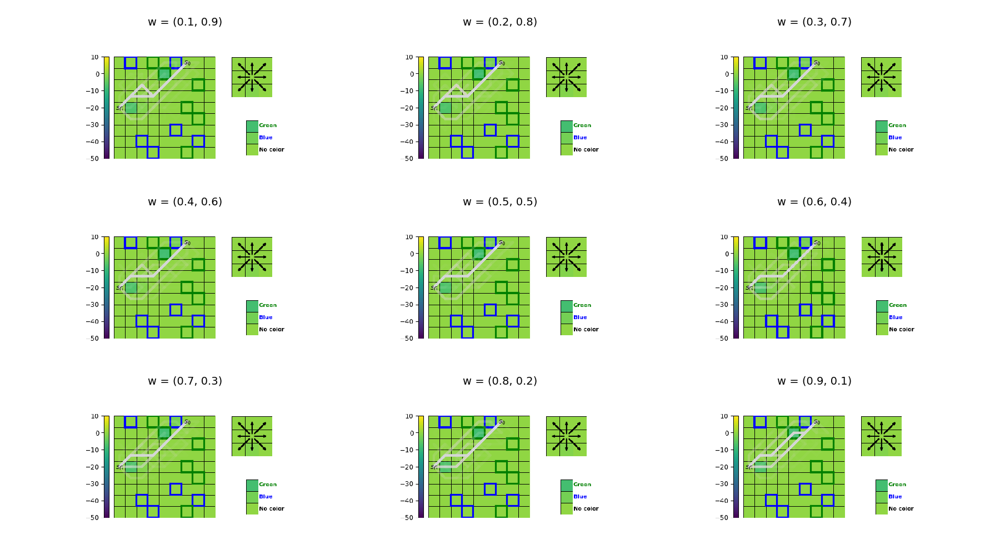

<IPython.core.display.Javascript object>


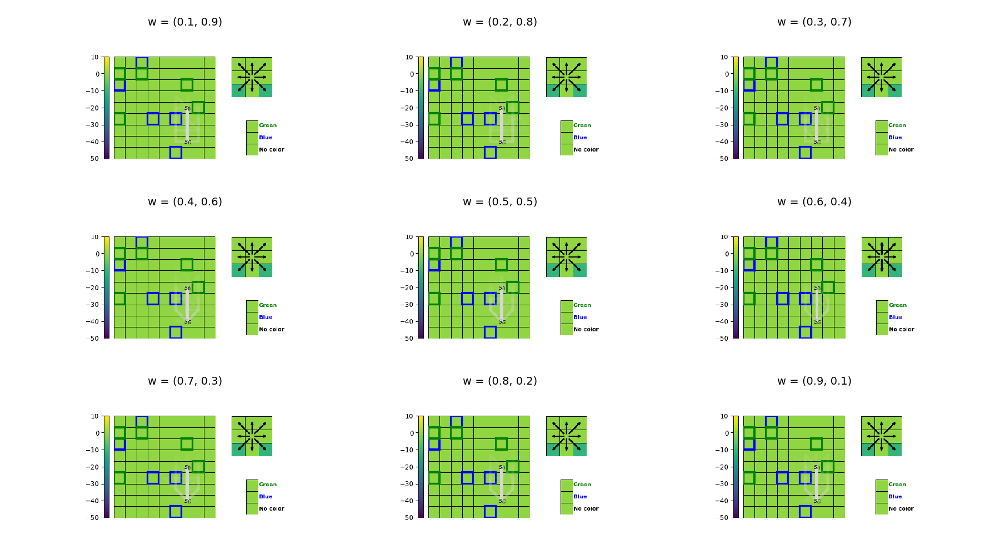

<IPython.core.display.Javascript object>


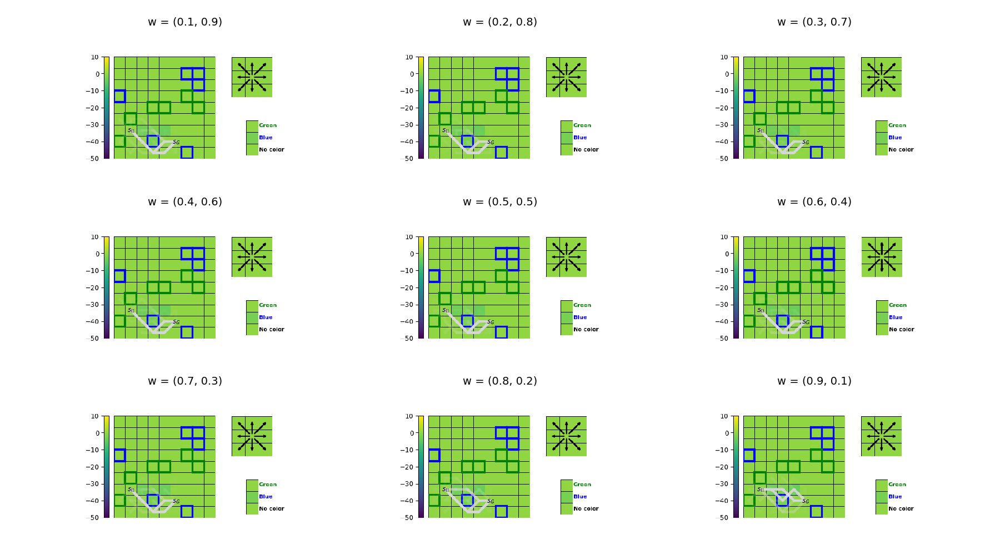

<IPython.core.display.Javascript object>


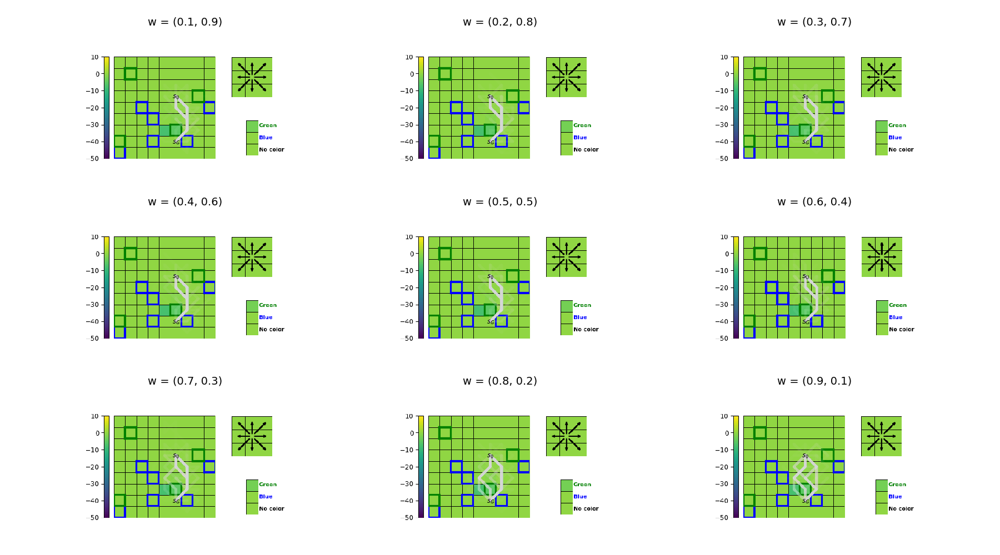

In [39]:
mdft_matrix = []   

#[n, c, learned_params, learned_mdp]

for test in range(n_tests):
    fig = plt.figure(figsize=(9, 5))
    axis = fig.subplots(3, 3)

    n_cfg = worlds[test]['n']
    c_cfg = worlds[test]['c']
    constraints = worlds[test]['constraints']
    n = n_cfg.mdp
    c = c_cfg.mdp
    learned_params = worlds[test]['learned_params']
    learned_mdp = worlds[test]['learned_mdp']
    
    mdft_matrix.append([])
    
    for i in range(9):
        w = [(i+1)/10, 1 - (i+1)/10]
        demo_mdft = G.generate_mdft_trajectories(n.world, n.reward, learned_params.reward, n.start, n.terminal, w)

        #temp_matrix, avg_mdft, avg_reward, avg_violated = count_states(demo_mdft[0], c)
        temp_matrix, avg_length, avg_reward, avg_violated, counters = count_states(demo_mdft.trajectories, c_cfg, constraints)
        mdft_matrix[test].append({i: {'temp_matrix': temp_matrix, 'demo': demo_mdft, 'avg_length': avg_length, 'avg_reward':avg_reward, 'avg_violated': avg_violated, 'counters':counters}})
        
        plt.ioff()
        f1 = G.plot_world(f'w = ({w[0]:0.1f}, {w[1]:0.1f})', learned_mdp, learned_params.state_weights, 
                      learned_params.action_weights, learned_params.color_weights, 
                      demo_mdft, c_cfg.blue, c_cfg.green, vmin=-50, vmax=10)
        plt.close()
        plt.ion()
        canvas = FigureCanvas(f1)
        canvas.draw()
        X = np.array(canvas.renderer.buffer_rgba())

        x = i // 3
        y = i % 3
        axis[x,y].axis('off')   
        axis[x,y].set_title(f'w = ({w[0]:0.1f}, {w[1]:0.1f})', fontsize=7)
        axis[x,y].imshow(X)


    fig.tight_layout()

In [33]:
mdft_matrix[0][1][1].keys()

dict_keys(['temp_matrix', 'demo', 'avg_length', 'avg_reward', 'avg_violated', 'counters'])

<IPython.core.display.Javascript object>


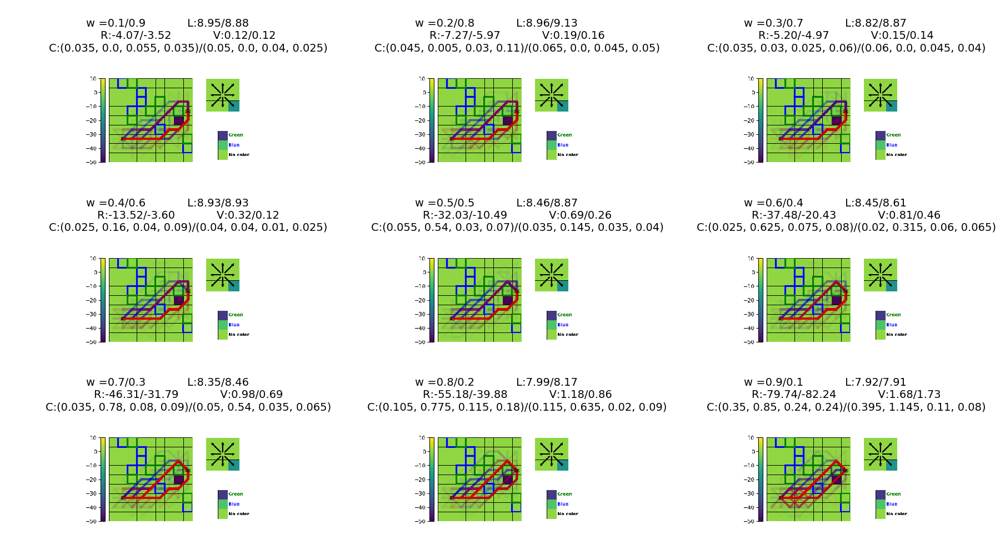

<IPython.core.display.Javascript object>


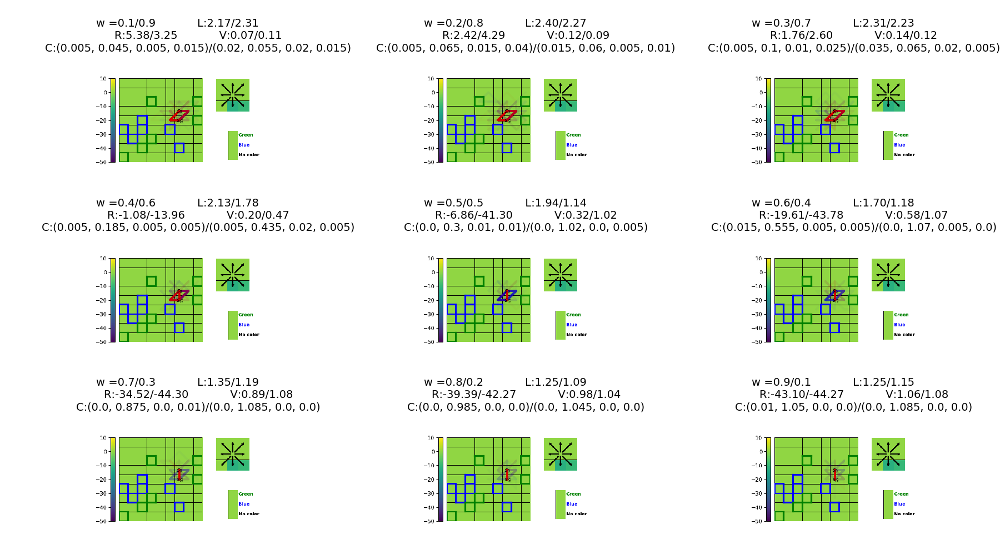

<IPython.core.display.Javascript object>


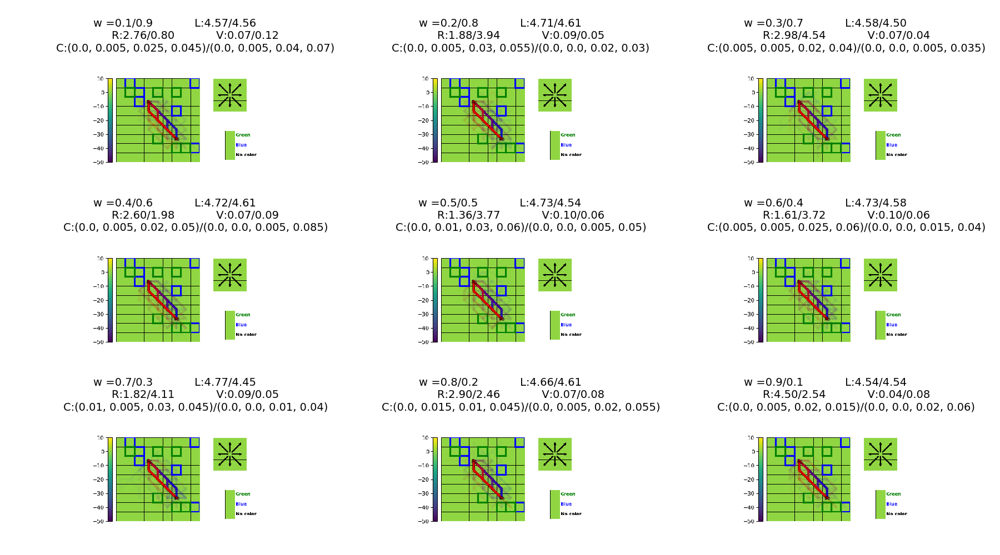

<IPython.core.display.Javascript object>


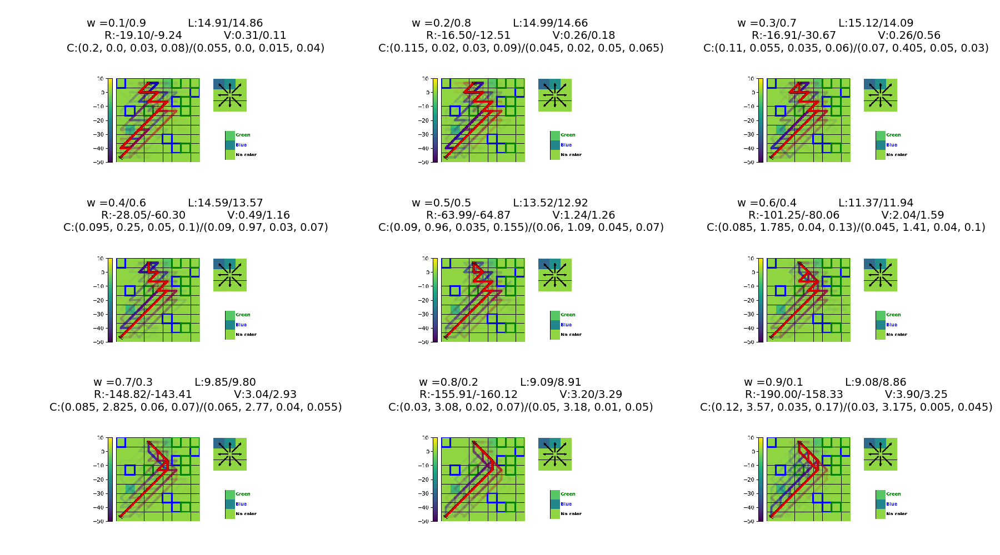

<IPython.core.display.Javascript object>


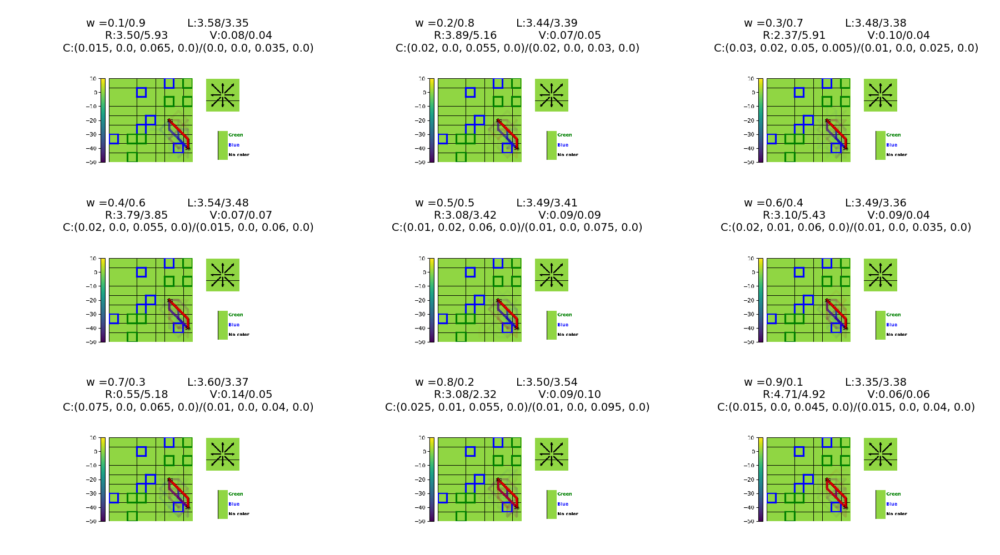

<IPython.core.display.Javascript object>


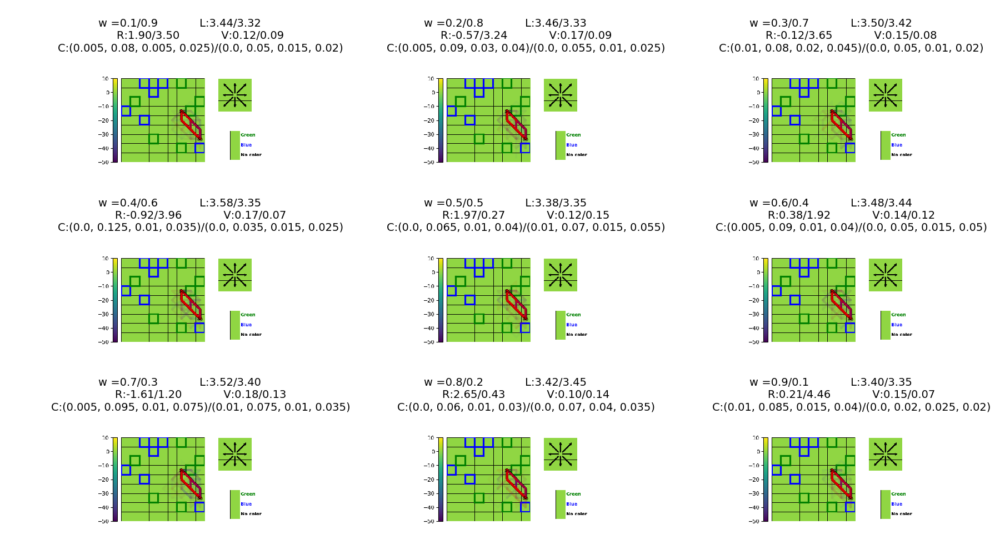

<IPython.core.display.Javascript object>


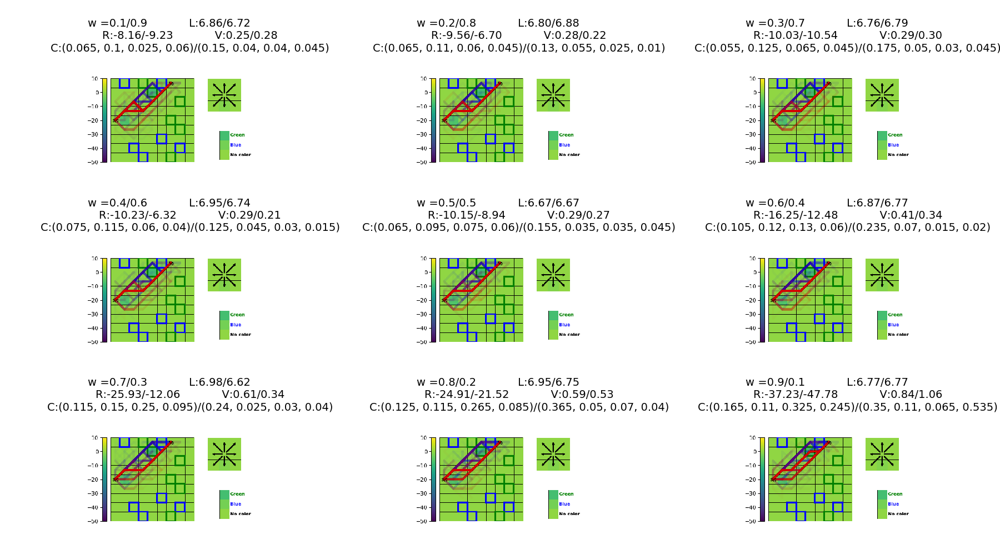

<IPython.core.display.Javascript object>


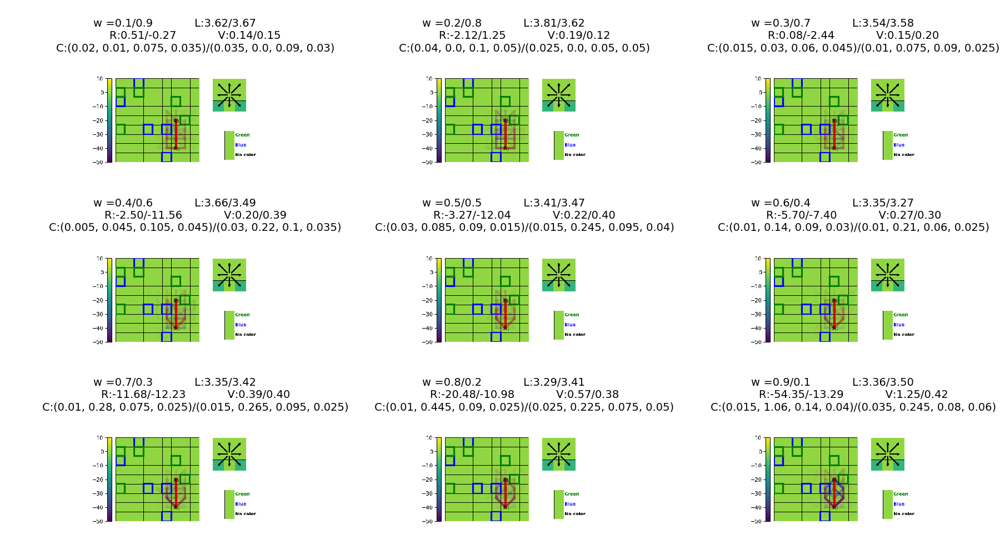

<IPython.core.display.Javascript object>


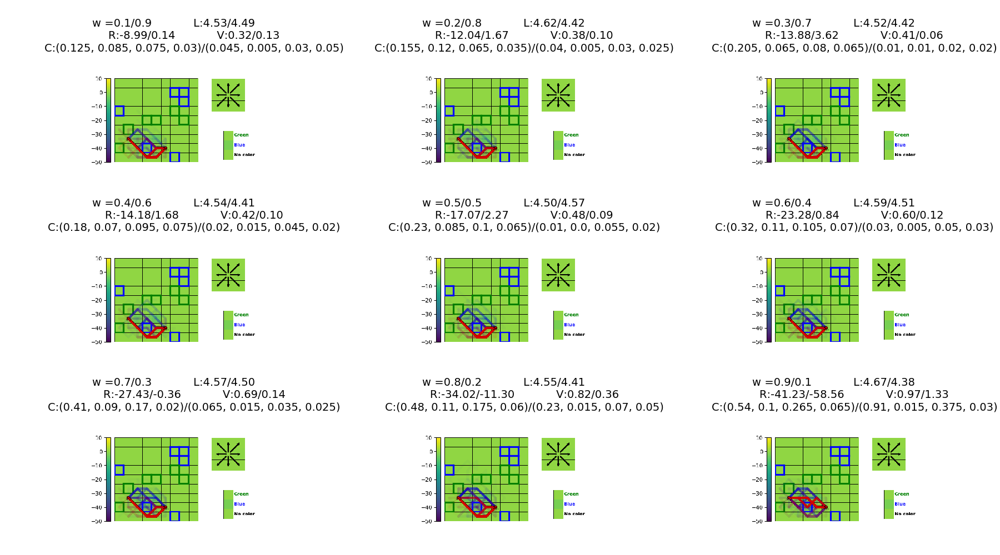

<IPython.core.display.Javascript object>


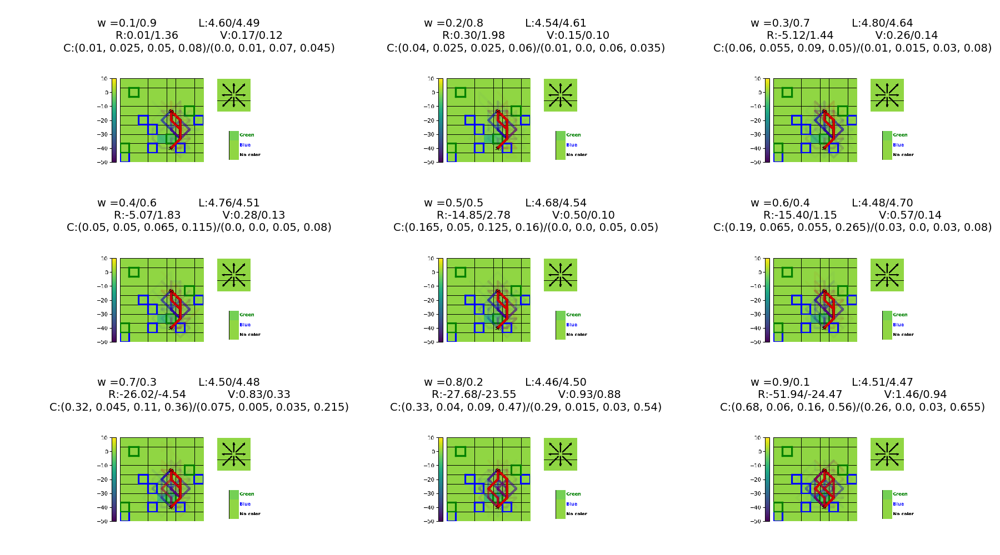

/Users/aloreggia/Documents/GitHub/soft_constraint_irl/max_ent/examples/grid_9_by_9.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(num=title, figsize=fsize)


In [41]:
for test in range(n_tests):
    fig = plt.figure(figsize=(9, 5))
    axis = fig.subplots(3, 3)

    n_cfg = worlds[test]['n']
    c_cfg = worlds[test]['c']
    n = n_cfg.mdp
    c = c_cfg.mdp
    learned_params = worlds[test]['learned_params']
    learned_mdp = worlds[test]['learned_mdp']

    for i in range(9):
        w = [(i+1)/10, 1 - (i+1)/10]
        demo_mdft = mdft_matrix[test][i][i]['demo']
        demo_wrl = wrl_matrix[test][i][i]['demo']
        
        
        plt.ioff()
        f1 = G.plot_trajectory_comparison(f"w ={w[0]:0.1f}/{w[1]:0.1f}", 
                                          learned_mdp, learned_params.state_weights, 
                      learned_params.action_weights, learned_params.color_weights, 
                      demo_wrl, demo_mdft, c_cfg.blue, c_cfg.green, vmin=-50, vmax=10)
        plt.close()
        plt.ion()
        canvas = FigureCanvas(f1)
        canvas.draw()
        X = np.array(canvas.renderer.buffer_rgba())

        x = i // 3
        y = i % 3
        axis[x,y].axis('off')   
        axis[x,y].set_title(f"w ={w[0]:0.1f}/{w[1]:0.1f}\
            L:{wrl_matrix[test][i][i]['avg_length']:0.2f}/{mdft_matrix[test][i][i]['avg_length']:0.2f}\n\
            R:{wrl_matrix[test][i][i]['avg_reward']:0.2f}/{mdft_matrix[test][i][i]['avg_reward']:0.2f}\
            V:{wrl_matrix[test][i][i]['avg_violated']:0.2f}/{mdft_matrix[test][i][i]['avg_violated']:0.2f}\n\
            C:{wrl_matrix[test][i][i]['counters']}/{mdft_matrix[test][i][i]['counters']}", fontsize=7)
        axis[x,y].imshow(X)


    fig.tight_layout()

In [ ]:
print(f"\t\t MDFT \t\t WRL")
for i in range(9):
    w = [(i+1)/10, 1 - (i+1)/10]
    print(f'w = ({w[0]:0.1f}, {w[1]:0.1f})')
    p = np.reshape(wrl_matrix[i][0], (-1,1))
    q = np.reshape(mdft_matrix[i][0], (-1,1))
    
    avg_length_mdft = mdft_matrix[i][1]
    avg_length_wrl = wrl_matrix[i][1]
    avg_rew_mdft = mdft_matrix[i][2]
    avg_rew_wrl = wrl_matrix[i][2]
    avg_vc_mdft = mdft_matrix[i][3]
    avg_vc_wrl = wrl_matrix[i][3]
    print(f"AVG LENGTH: \t{avg_length_mdft}\t\t {avg_length_wrl}")
    print(f"AVG REWARD: \t{avg_rew_mdft}\t\t {avg_rew_wrl}")
    print(f"AVG VC: \t{avg_vc_mdft}\t\t {avg_vc_wrl}")
    print(f"KL(RL||MDFT) {kl_divergence(p,q)} \t KL(MDFT||RL) {kl_divergence(q,p)}")
    print(f"JS(RL||MDFT) {js_divergence(p,q)} \t JS DISTANCE {distance.jensenshannon(p,q)}")
    print("---------------------------------------------------------\n")

In [45]:
print(f"\t\t MDFT \t\t WRL")

for i in range(9):
    avg_length_mdft = 0.0
    avg_length_wrl = 0.0
    avg_rew_mdft = 0.0
    avg_rew_wrl = 0.0
    avg_vc_mdft = 0.0
    avg_vc_wrl = 0.0
    w = [(i+1)/10, 1 - (i+1)/10]
    print(f'w = ({w[0]:0.1f}, {w[1]:0.1f})')
    for test in range(n_tests):
    
        #p = np.reshape(wrl_matrix[i][0], (-1,1))
        #q = np.reshape(mdft_matrix[i][0], (-1,1))


        #w ={w[0]:0.1f}/{w[1]:0.1f}\
        #L:{wrl_matrix[test][i][i]['avg_length']:0.2f}/{mdft_matrix[test][i][i]['avg_length']:0.2f}\n\
        #R:{wrl_matrix[test][i][i]['avg_reward']:0.2f}/{c:0.2f}\
        #V:{wrl_matrix[test][i][i]['avg_violated']:0.2f}/{mdft_matrix[test][i][i]['avg_violated']:0.2f}\n\
        #C:{wrl_matrix[test][i][i]['counters']}/{mdft_matrix[test][i][i]['counters']}

        avg_length_mdft += mdft_matrix[test][i][i]['avg_length']
        avg_length_wrl += wrl_matrix[test][i][i]['avg_length']
        avg_rew_mdft += mdft_matrix[test][i][i]['avg_reward']
        avg_rew_wrl += wrl_matrix[test][i][i]['avg_reward']
        avg_vc_mdft += mdft_matrix[test][i][i]['avg_violated']
        avg_vc_wrl += wrl_matrix[test][i][i]['avg_violated']
        
    print(f"AVG LENGTH: \t{avg_length_mdft/n_tests:0.4f}\t\t {avg_length_wrl/n_tests:0.4f}")
    print(f"AVG REWARD: \t{avg_rew_mdft/n_tests:0.4f}\t\t {avg_rew_wrl/n_tests:0.4f}")
    print(f"AVG VC: \t{avg_vc_mdft/n_tests:0.4f}\t\t {avg_vc_wrl/n_tests:0.4f}")
    #print(f"KL(RL||MDFT) {kl_divergence(p,q)} \t KL(MDFT||RL) {kl_divergence(q,p)}")
    #print(f"JS(RL||MDFT) {js_divergence(p,q)} \t JS DISTANCE {distance.jensenshannon(p,q)}")
    print("---------------------------------------------------------\n")

		 MDFT 		 WRL
w = (0.1, 0.9)
AVG LENGTH: 	5.6650		 5.7215
AVG REWARD: 	-0.7290		 -2.6280
AVG VC: 	0.1255		 0.1645
---------------------------------------------------------

w = (0.2, 0.8)
AVG LENGTH: 	5.6935		 5.7720
AVG REWARD: 	-0.3650		 -3.9565
AVG VC: 	0.1170		 0.1895
---------------------------------------------------------

w = (0.3, 0.7)
AVG LENGTH: 	5.5915		 5.7440
AVG REWARD: 	-2.6865		 -4.4065
AVG VC: 	0.1675		 0.1990
---------------------------------------------------------

w = (0.4, 0.6)
AVG LENGTH: 	5.4875		 5.7405
AVG REWARD: 	-8.2440		 -6.9165
AVG VC: 	0.2810		 0.2520
---------------------------------------------------------

w = (0.5, 0.5)
AVG LENGTH: 	5.3485		 5.4765
AVG REWARD: 	-12.5125		 -14.1815
AVG VC: 	0.3685		 0.4055
---------------------------------------------------------

w = (0.6, 0.4)
AVG LENGTH: 	5.2360		 5.2505
AVG REWARD: 	-15.1110		 -21.3880
AVG VC: 	0.4245		 0.5620
---------------------------------------------------------

w = (0.7, 0.3)
AVG LENGTH: 

In [ ]:
np.mean()